## Final Project Submission

Please fill out:
* Student name: Sunwoong Kim
* Student pace: part time
* Scheduled project review date/time: June 23, 2020/ 6:15 PM
* Instructor name: Eli Thomas
* Blog post URL: TBD


# Questions to ask

### What are 3 features that impact the housing price the most?

The reason for this question is simple. In order to invest or purchase the house, what factors you have to look into the most in order to bring out the best results. If you are selling the house, you can have a ball park of the appraisal value of your house to expect/inspect fairness.

# Outline:

1. Data Observation
2. Data Cleaning
3. Visuallization
4. Future Work 
5. Conclusion

Begin by importing necessary libraries and Data

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.float_format', lambda x: '%.2f' % x)
pd.set_option('display.max_columns', 21)
pd.set_option('display.max_rows', 70)

df = pd.read_csv("kc_house_data.csv")



## Column Names and descriptions for Kings County Data Set
* **id** - unique identified for a house
* **dateDate** - house was sold
* **pricePrice** -  is prediction target
* **bedroomsNumber** -  of Bedrooms/House
* **bathroomsNumber** -  of bathrooms/bedrooms
* **sqft_livingsquare** -  footage of the home
* **sqft_lotsquare** -  footage of the lot
* **floorsTotal** -  floors (levels) in house
* **waterfront** - House which has a view to a waterfront
* **view** - Has been viewed
* **condition** - How good the condition is ( Overall )
* **grade** - overall grade given to the housing unit, based on King County grading system
* **sqft_above** - square footage of house apart from basement
* **sqft_basement** - square footage of the basement
* **yr_built** - Built Year
* **yr_renovated** - Year when house was renovated
* **zipcode** - zip
* **lat** - Latitude coordinate
* **long** - Longitude coordinate
* **sqft_living15** - The square footage of interior housing living space for the nearest 15 neighbors
* **sqft_lot15** - The square footage of the land lots of the nearest 15 neighbors

# 1. Data Overview

## 1.1 Data Observation

Observe the data!!

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


In [4]:
df.shape

(21597, 21)

In [5]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.00,3,1.00,1180,5650,1.00,nan,0.00,3,7,1180,0.0,1955,0.00,98178,47.51,-122.26,1340,5650
1,6414100192,12/9/2014,538000.00,3,2.25,2570,7242,2.00,0.00,0.00,3,7,2170,400.0,1951,1991.00,98125,47.72,-122.32,1690,7639
2,5631500400,2/25/2015,180000.00,2,1.00,770,10000,1.00,0.00,0.00,3,6,770,0.0,1933,nan,98028,47.74,-122.23,2720,8062
3,2487200875,12/9/2014,604000.00,4,3.00,1960,5000,1.00,0.00,0.00,5,7,1050,910.0,1965,0.00,98136,47.52,-122.39,1360,5000
4,1954400510,2/18/2015,510000.00,3,2.00,1680,8080,1.00,0.00,0.00,3,8,1680,0.0,1987,0.00,98074,47.62,-122.05,1800,7503


In [6]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,21597.00,21597.00,21597.00,21597.00,21597.00,21597.00,21597.00,19221.00,21534.00,21597.00,21597.00,21597.00,21597.00,17755.00,21597.00,21597.00,21597.00,21597.00,21597.00
mean,4580474287.77,540296.57,3.37,2.12,2080.32,15099.41,1.49,0.01,0.23,3.41,7.66,1788.60,1971.00,83.64,98077.95,47.56,-122.21,1986.62,12758.28
std,2876735715.75,367368.14,0.93,0.77,918.11,41412.64,0.54,0.09,0.77,0.65,1.17,827.76,29.38,399.95,53.51,0.14,0.14,685.23,27274.44
min,1000102.00,78000.00,1.00,0.50,370.00,520.00,1.00,0.00,0.00,1.00,3.00,370.00,1900.00,0.00,98001.00,47.16,-122.52,399.00,651.00
25%,2123049175.00,322000.00,3.00,1.75,1430.00,5040.00,1.00,0.00,0.00,3.00,7.00,1190.00,1951.00,0.00,98033.00,47.47,-122.33,1490.00,5100.00
50%,3904930410.00,450000.00,3.00,2.25,1910.00,7618.00,1.50,0.00,0.00,3.00,7.00,1560.00,1975.00,0.00,98065.00,47.57,-122.23,1840.00,7620.00
75%,7308900490.00,645000.00,4.00,2.50,2550.00,10685.00,2.00,0.00,0.00,4.00,8.00,2210.00,1997.00,0.00,98118.00,47.68,-122.12,2360.00,10083.00
max,9900000190.00,7700000.00,33.00,8.00,13540.00,1651359.00,3.50,1.00,4.00,5.00,13.00,9410.00,2015.00,2015.00,98199.00,47.78,-121.31,6210.00,871200.00


## 1.2 Data Touch/Clean up for Observation

Data touch up time!!

First find the empty Data! Using isna method

In [7]:
df.isnull().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

I would like to find out if ID column is important. By definition, Id is an unique identified for a house.

In [8]:
sum(np.array(df.id.value_counts()>1)) 
#To find out if 1 id holds 1 house information
#There are 176 ids that are duplicates

176

In [9]:
dup_ids = np.array(df.id.value_counts().index)[0:176]
len(dup_ids)

176

In [10]:
dup_id_df = pd.DataFrame([])
for dup_id in dup_ids:
    init_df = df.loc[df.id == dup_id]
    dup_id_df = dup_id_df.append(init_df)

In [11]:
dup_id_df.head(21)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
17588,795000620,9/24/2014,115000.00,3,1.00,1080,6250,1.00,0.00,0.00,2,5,1080,0.0,1950,0.00,98168,47.50,-122.33,1070,6250
17589,795000620,12/15/2014,124000.00,3,1.00,1080,6250,1.00,0.00,0.00,2,5,1080,0.0,1950,0.00,98168,47.50,-122.33,1070,6250
17590,795000620,3/11/2015,157000.00,3,1.00,1080,6250,1.00,nan,0.00,2,5,1080,0.0,1950,nan,98168,47.50,-122.33,1070,6250
3946,1825069031,8/14/2014,550000.00,4,1.75,2410,8447,2.00,0.00,3.00,4,8,2060,350.0,1936,1980.00,98074,47.65,-122.09,2520,14789
3947,1825069031,10/16/2014,550000.00,4,1.75,2410,8447,2.00,nan,3.00,4,8,2060,350.0,1936,1980.00,98074,47.65,-122.09,2520,14789
12942,2019200220,9/23/2014,160000.00,3,2.25,1470,8682,1.00,0.00,0.00,3,7,1160,310.0,1985,0.00,98003,47.27,-122.30,1670,8359
12943,2019200220,2/26/2015,269000.00,3,2.25,1470,8682,1.00,0.00,0.00,3,7,1160,310.0,1985,nan,98003,47.27,-122.30,1670,8359
15796,7129304540,12/20/2014,133000.00,5,2.00,1430,5600,1.50,0.00,0.00,3,6,1430,0.0,1947,nan,98118,47.52,-122.27,1860,5980
15797,7129304540,5/14/2015,440000.00,5,2.00,1430,5600,1.50,0.00,0.00,3,6,1430,0.0,1947,0.00,98118,47.52,-122.27,1860,5980
2500,1781500435,8/20/2014,260000.00,3,1.75,1580,7344,1.00,0.00,0.00,5,7,1580,0.0,1911,nan,98126,47.53,-122.38,1580,6207


In [12]:
dup_id_df.tail(10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
15642,7893805650,5/5/2014,210000.00,5,2.00,2050,10200,1.00,0.00,0.00,3,6,1430,620.0,1956,0.00,98198,47.41,-122.33,1940,8625
15643,7893805650,3/13/2015,475000.00,5,2.00,2050,10200,1.00,0.00,0.00,3,6,1430,620.0,1956,0.00,98198,47.41,-122.33,1940,8625
11190,8161020060,6/20/2014,443500.00,4,2.50,2040,21781,2.00,0.00,0.00,3,8,2040,0.0,1994,0.00,98014,47.65,-121.90,2410,21781
11191,8161020060,4/14/2015,471000.00,4,2.50,2040,21781,2.00,0.00,0.00,3,8,2040,0.0,1994,0.00,98014,47.65,-121.90,2410,21781
14560,1432400120,11/11/2014,165000.00,3,1.00,1010,7690,1.00,0.00,0.00,4,6,1010,0.0,1958,nan,98058,47.45,-122.18,1010,7619
14561,1432400120,5/8/2015,255000.00,3,1.00,1010,7690,1.00,0.00,0.00,4,6,1010,0.0,1958,0.00,98058,47.45,-122.18,1010,7619
11350,7701960990,6/16/2014,862000.00,4,2.50,3190,14565,2.00,0.00,0.00,3,11,3190,0.0,1990,0.00,98077,47.71,-122.07,3420,20475
11351,7701960990,8/19/2014,870000.00,4,2.50,3190,14565,2.00,0.00,0.00,3,11,3190,0.0,1990,0.00,98077,47.71,-122.07,3420,20475
13743,1788900230,7/22/2014,86500.00,3,1.00,840,9480,1.00,0.00,0.00,3,6,840,0.0,1960,0.00,98023,47.33,-122.34,840,9420
13744,1788900230,4/3/2015,199950.00,3,1.00,840,9480,1.00,0.00,0.00,3,6,840,0.0,1960,0.00,98023,47.33,-122.34,840,9420


Price comparison, date sold, auction? renovation? there are so many other factors!! Involved in this!

sqft_living is sum of sqft_above and sqft_basement. 

I noticed that column sqft_basement is type 'Object'! I will convert it to type float.

In [13]:
df.sqft_basement.value_counts()

0.0       12826
?           454
600.0       217
500.0       209
700.0       208
          ...  
176.0         1
2310.0        1
1990.0        1
518.0         1
1024.0        1
Name: sqft_basement, Length: 304, dtype: int64

In [14]:
df.sqft_basement.unique()

array(['0.0', '400.0', '910.0', '1530.0', '?', '730.0', '1700.0', '300.0',
       '970.0', '760.0', '720.0', '700.0', '820.0', '780.0', '790.0',
       '330.0', '1620.0', '360.0', '588.0', '1510.0', '410.0', '990.0',
       '600.0', '560.0', '550.0', '1000.0', '1600.0', '500.0', '1040.0',
       '880.0', '1010.0', '240.0', '265.0', '290.0', '800.0', '540.0',
       '710.0', '840.0', '380.0', '770.0', '480.0', '570.0', '1490.0',
       '620.0', '1250.0', '1270.0', '120.0', '650.0', '180.0', '1130.0',
       '450.0', '1640.0', '1460.0', '1020.0', '1030.0', '750.0', '640.0',
       '1070.0', '490.0', '1310.0', '630.0', '2000.0', '390.0', '430.0',
       '850.0', '210.0', '1430.0', '1950.0', '440.0', '220.0', '1160.0',
       '860.0', '580.0', '2060.0', '1820.0', '1180.0', '200.0', '1150.0',
       '1200.0', '680.0', '530.0', '1450.0', '1170.0', '1080.0', '960.0',
       '280.0', '870.0', '1100.0', '460.0', '1400.0', '660.0', '1220.0',
       '900.0', '420.0', '1580.0', '1380.0', '475.0', 

Observe the data of sqft_basement with '?'.

'?' could be simply not having any information or author did not know the information. Since the information was not provided, I can assume that these 454 houses do not have any basement and consider it 0 or I can distribute them randomly based on the given data. 

I will '?' by converting them to 0 for no information

In [15]:
null_sqft_basement = df.loc[df.sqft_basement=='?']
display(null_sqft_basement.head())
null_sqft_basement.describe()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
6,1321400060,6/27/2014,257500.00,3,2.25,1715,6819,2.00,0.00,0.00,3,7,1715,?,1995,0.00,98003,47.31,-122.33,2238,6819
18,16000397,12/5/2014,189000.00,2,1.00,1200,9850,1.00,0.00,0.00,4,7,1200,?,1921,0.00,98002,47.31,-122.21,1060,5095
42,7203220400,7/7/2014,861990.00,5,2.75,3595,5639,2.00,0.00,0.00,3,9,3595,?,2014,0.00,98053,47.68,-122.02,3625,5639
79,1531000030,3/23/2015,720000.00,4,2.50,3450,39683,2.00,0.00,0.00,3,10,3450,?,2002,0.00,98010,47.34,-122.03,3350,39750
112,2525310310,9/16/2014,272500.00,3,1.75,1540,12600,1.00,0.00,0.00,4,7,1160,?,1980,0.00,98038,47.36,-122.03,1540,11656


,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,454.00,454.00,454.00,454.00,454.00,454.00,454.00,417.00,452.00,454.00,454.00,454.00,454.00,366.00,454.00,454.00,454.00,454.00,454.00
mean,4555793697.02,530323.32,3.40,2.10,2052.43,15670.87,1.52,0.01,0.26,3.41,7.64,1766.61,1969.90,114.27,98081.81,47.55,-122.22,1956.30,13659.03
std,2898736355.53,333003.05,0.99,0.79,897.86,50029.20,0.56,0.10,0.79,0.65,1.12,797.47,31.77,463.83,52.36,0.14,0.15,664.45,31810.91
min,11200400.00,102500.00,1.00,0.50,600.00,681.00,1.00,0.00,0.00,1.00,5.00,600.00,1900.00,0.00,98001.00,47.19,-122.46,740.00,977.00
25%,2066505312.50,320750.00,3.00,1.50,1430.00,5000.00,1.00,0.00,0.00,3.00,7.00,1162.50,1944.25,0.00,98033.25,47.46,-122.33,1490.00,5000.00
50%,3883401682.50,457000.00,3.00,2.25,1900.00,7200.00,1.50,0.00,0.00,3.00,7.00,1595.00,1975.00,0.00,98074.00,47.56,-122.27,1800.00,7211.00
75%,7235075825.00,649500.00,4.00,2.50,2510.00,10481.00,2.00,0.00,0.00,4.00,8.00,2180.00,1999.00,0.00,98118.75,47.67,-122.13,2337.50,9902.25
max,9834200305.00,3420000.00,7.00,5.50,6930.00,881654.00,3.00,1.00,4.00,5.00,11.00,5450.00,2015.00,2014.00,98199.00,47.77,-121.36,4560.00,438213.00


In [16]:
df.sqft_basement = [float(i.replace('?','0')) if i == '?' else float(i) for i in df.sqft_basement]
df.sqft_basement.head()
df.sqft_basement.describe()

count   21597.00
mean      285.72
std       439.82
min         0.00
25%         0.00
50%         0.00
75%       550.00
max      4820.00
Name: sqft_basement, dtype: float64

Next is to find the waterfront! It holds 2376 Null Values. Based on the Lat and Long we can assume its location; however, depends on the housing direction it might have have the waterfront.

In [17]:
df.waterfront.value_counts()

0.00    19075
1.00      146
Name: waterfront, dtype: int64

Though it could be an important piece of information, data holds too little information for the comparison to be made. So, I have decided to drop the entire column for not having a significant information.

In [18]:
null_water = df.loc[df.waterfront.isnull()==True]
null_water.head()
null_water.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2376.00,2376.00,2376.00,2376.00,2376.00,2376.00,2376.00,0.00,2370.00,2376.00,2376.00,2376.00,2376.00,2376.00,1946.00,2376.00,2376.00,2376.00,2376.00,2376.00
mean,4484801440.32,529430.07,3.36,2.11,2063.34,15306.89,1.49,nan,0.26,3.41,7.63,1766.19,292.80,1970.68,94.32,98079.69,47.56,-122.21,1980.51,12366.68
std,2873450638.46,325079.39,0.91,0.76,881.38,45954.95,0.54,nan,0.78,0.65,1.15,794.75,438.56,29.30,423.55,53.95,0.14,0.14,689.43,24694.19
min,1000102.00,80000.00,1.00,0.75,430.00,600.00,1.00,nan,0.00,1.00,4.00,430.00,0.00,1900.00,0.00,98001.00,47.18,-122.50,780.00,788.00
25%,2112250151.25,322875.00,3.00,1.50,1430.00,5031.75,1.00,nan,0.00,3.00,7.00,1190.00,0.00,1951.00,0.00,98033.75,47.47,-122.33,1470.00,5108.00
50%,3789200120.00,445000.00,3.00,2.25,1900.00,7607.00,1.50,nan,0.00,3.00,7.00,1550.00,0.00,1973.00,0.00,98070.00,47.57,-122.23,1820.00,7624.50
75%,7227500771.25,649612.50,4.00,2.50,2520.00,10524.75,2.00,nan,0.00,4.00,8.00,2190.00,590.00,1996.00,0.00,98118.00,47.68,-122.13,2370.00,10001.25
max,9839301055.00,3200000.00,8.00,6.50,7730.00,1074218.00,3.50,nan,4.00,5.00,12.00,6660.00,2160.00,2015.00,2015.00,98199.00,47.78,-121.32,4940.00,311610.00


Next is the view counts. There were 63 Null Values.

In [19]:
df.view.value_counts()

0.00    19422
2.00      957
3.00      508
1.00      330
4.00      317
Name: view, dtype: int64

After looking at the value. These 63 values can be converted to zero.

In [20]:
null_view = df.loc[df.view.isnull()==True]
display(null_view.head())
null_view.describe()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7,2008000270,1/15/2015,291850.00,3,1.50,1060,9711,1.00,0.00,nan,3,7,1060,0.00,1963,0.00,98198,47.41,-122.31,1650,9711
114,8961960160,10/28/2014,480000.00,4,2.50,3230,16171,2.00,0.00,nan,3,9,2520,710.00,2001,0.00,98001,47.32,-122.25,2640,8517
129,7853210060,4/6/2015,430000.00,4,2.50,2070,4310,2.00,0.00,nan,3,7,2070,0.00,2004,0.00,98065,47.53,-121.85,1970,3748
205,3456000310,8/4/2014,840000.00,4,1.75,2480,11010,1.00,0.00,nan,4,9,1630,850.00,1966,nan,98040,47.54,-122.22,2770,10744
487,1895000260,7/21/2014,207950.00,2,2.00,890,5000,1.00,0.00,nan,3,6,890,0.00,1917,0.00,98118,47.52,-122.26,1860,5000


,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,63.00,63.00,63.00,63.00,63.00,63.00,63.00,57.00,0.00,63.00,63.00,63.00,63.00,63.00,51.00,63.00,63.00,63.00,63.00,63.00
mean,3938990607.38,621958.17,3.43,2.15,2249.17,18111.57,1.48,0.02,nan,3.44,7.83,1802.03,447.14,1970.11,39.12,98082.22,47.53,-122.23,2096.13,15220.68
std,2811234324.76,680927.09,0.89,0.90,1117.12,51631.81,0.50,0.13,nan,0.62,1.35,839.15,564.20,29.32,279.36,55.95,0.14,0.14,719.02,33298.11
min,104540840.00,144000.00,2.00,1.00,890.00,2159.00,1.00,0.00,nan,3.00,6.00,790.00,0.00,1905.00,0.00,98001.00,47.21,-122.41,900.00,1288.00
25%,1845600200.00,322475.00,3.00,1.75,1445.00,5766.50,1.00,0.00,nan,3.00,7.00,1195.00,0.00,1950.00,0.00,98035.00,47.40,-122.33,1530.00,5943.00
50%,3448900210.00,480000.00,3.00,2.25,2120.00,7725.00,1.50,0.00,nan,3.00,7.00,1580.00,270.00,1975.00,0.00,98072.00,47.54,-122.27,1980.00,7700.00
75%,6021500288.50,679000.00,4.00,2.50,2545.00,10235.50,2.00,0.00,nan,4.00,9.00,2470.00,815.00,1994.00,0.00,98125.00,47.63,-122.14,2500.00,9665.00
max,9468200140.00,5300000.00,6.00,6.00,7390.00,360241.00,2.50,1.00,nan,5.00,12.00,5000.00,2390.00,2014.00,1995.00,98199.00,47.78,-121.85,4470.00,209959.00


In [21]:
df.view = df.view.fillna(0)

Lastly, I will be looking at yr_renovated.

There were 3842 Missing values which could be a significant amount to the data.

In [22]:
df.yr_renovated.value_counts().head(10)

0.00       17011
2014.00       73
2003.00       31
2013.00       31
2007.00       30
2000.00       29
2005.00       29
1990.00       22
2004.00       22
2009.00       21
Name: yr_renovated, dtype: int64

In [23]:
null_renovate = df.loc[df.yr_renovated.isnull()==True]
display(null_renovate.head())
null_renovate.describe()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
2,5631500400,2/25/2015,180000.00,2,1.00,770,10000,1.00,0.00,0.00,3,6,770,0.00,1933,nan,98028,47.74,-122.23,2720,8062
12,114101516,5/28/2014,310000.00,3,1.00,1430,19901,1.50,0.00,0.00,4,7,1430,0.00,1927,nan,98028,47.76,-122.23,1780,12697
23,8091400200,5/16/2014,252700.00,2,1.50,1070,9643,1.00,nan,0.00,3,7,1070,0.00,1985,nan,98030,47.35,-122.17,1220,8386
26,1794500383,6/26/2014,937000.00,3,1.75,2450,2691,2.00,0.00,0.00,3,8,1750,700.00,1915,nan,98119,47.64,-122.36,1760,3573
28,5101402488,6/24/2014,438000.00,3,1.75,1520,6380,1.00,0.00,0.00,3,7,790,730.00,1948,nan,98115,47.70,-122.30,1520,6235


,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,3842.00,3842.00,3842.00,3842.00,3842.00,3842.00,3842.00,3412.00,3842.00,3842.00,3842.00,3842.00,3842.00,3842.00,0.00,3842.00,3842.00,3842.00,3842.00,3842.00
mean,4564007427.62,538617.00,3.35,2.09,2061.98,14254.28,1.49,0.01,0.24,3.41,7.64,1774.89,280.31,1970.50,nan,98078.81,47.56,-122.22,1971.42,12258.32
std,2878860364.46,358344.60,0.90,0.78,920.37,38026.16,0.55,0.09,0.78,0.64,1.18,832.66,433.23,29.48,nan,53.63,0.14,0.14,686.52,25102.87
min,3600072.00,78000.00,1.00,0.50,500.00,635.00,1.00,0.00,0.00,1.00,4.00,490.00,0.00,1900.00,nan,98001.00,47.16,-122.51,460.00,651.00
25%,2099175099.00,322976.00,3.00,1.50,1410.00,5040.00,1.00,0.00,0.00,3.00,7.00,1180.00,0.00,1950.00,nan,98033.00,47.48,-122.33,1470.00,5058.50
50%,3886953794.00,450000.00,3.00,2.25,1900.00,7665.00,1.00,0.00,0.00,3.00,7.00,1545.00,0.00,1974.00,nan,98070.00,47.58,-122.24,1820.00,7624.50
75%,7300400165.00,643375.00,4.00,2.50,2530.00,10706.00,2.00,0.00,0.00,4.00,8.00,2190.00,540.00,1996.00,nan,98118.00,47.68,-122.13,2320.00,10015.50
max,9900000190.00,5570000.00,8.00,6.75,9200.00,881654.00,3.50,1.00,4.00,5.00,13.00,8020.00,3000.00,2015.00,nan,98199.00,47.78,-121.31,5790.00,392040.00


Though renovation would be a important factor for the price determination, missing values could simply mean that they did not have information. I will convert the null as a missing value and treat it as a 0.

In [24]:
df.yr_renovated = df.yr_renovated.fillna(0)

In [25]:
df.yr_renovated.value_counts().head()

0.00       20853
2014.00       73
2003.00       31
2013.00       31
2007.00       30
Name: yr_renovated, dtype: int64

Lastly I would like to conver the date to the month and year for the seasonal check. Change in market over the year. 

In [26]:
sold_year =[]
sold_month = []
for i in df.date:
    date = i.split(sep='/')
    year = int(date[-1])
    month= int(date[0])
    sold_year.append(year)
    sold_month.append(month)
df['sold_year'] = sold_year
df['sold_month'] = sold_month

In [27]:
df = df.drop(columns=["date", "id", 'sold_year', 'waterfront', 'yr_renovated'])

## 1.3 Over view of the data!

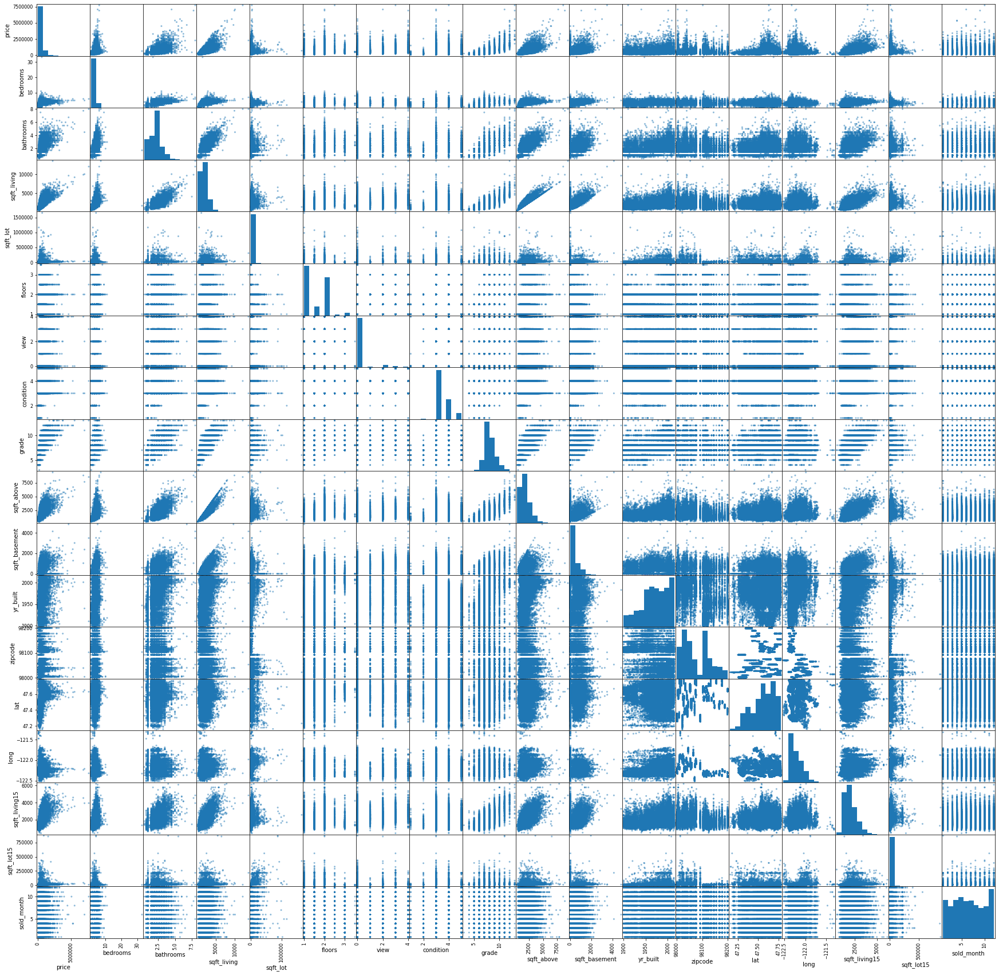

In [28]:
pd.plotting.scatter_matrix(df, figsize=(30,30));plt.show()

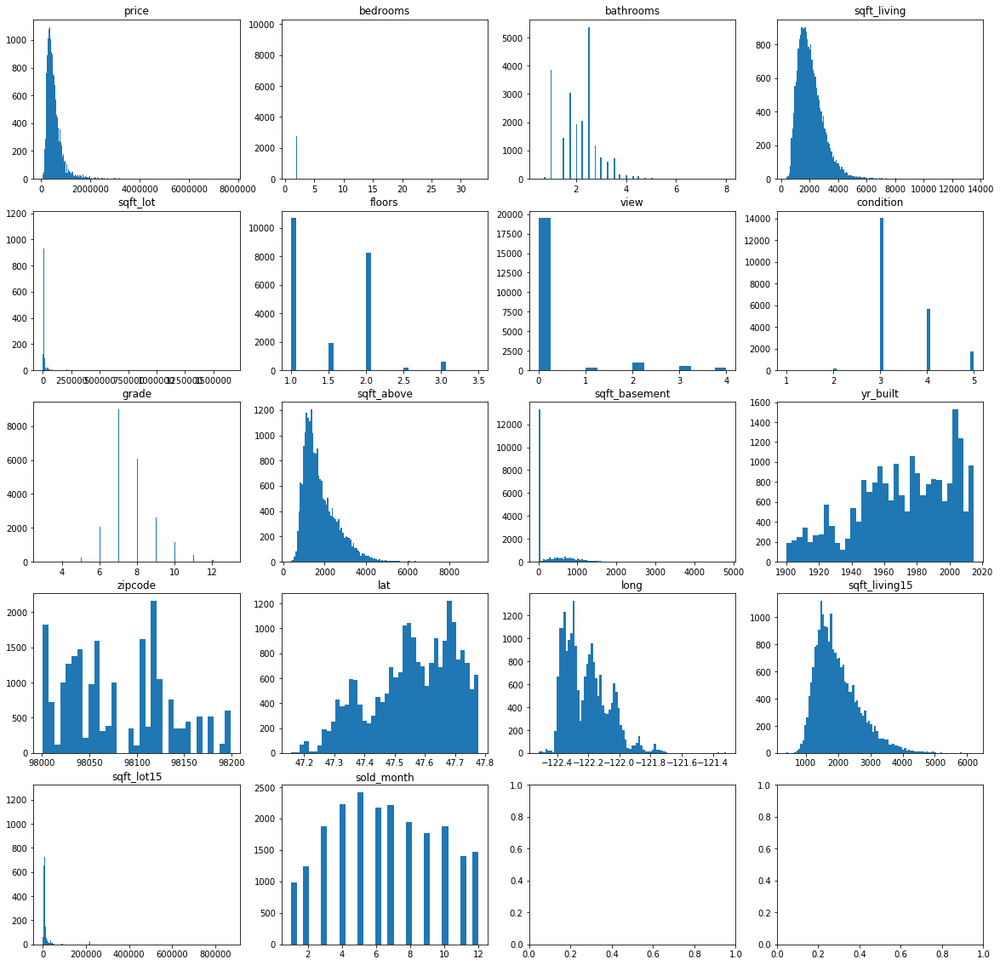

In [29]:
rows = len(df.columns)//4
if len(df.columns)%4 >0: rows += 1
fig, ax = plt.subplots(nrows=rows, ncols=4, figsize=[20,20])
for i in range(len(df.columns)):
    ax[i//4][i%4].hist(df[df.columns[i]], bins='auto')
    ax[i//4][i%4].set_title(df.columns[i])
plt.show()

Above histograms show that I need to work on some data cleaning by centralizing the data, scaling and take out outliers!

In [30]:
#Define lists
non_cat = ['sqft_living', 'sqft_lot', 'sqft_above', 'lat',
           'long', 'sqft_living15','sqft_lot15']
cat = ['bedrooms', 'bathrooms', 'floors','view','condition', 'sqft_basement','grade','yr_built',
       'zipcode','sold_month']
non_cat_price = non_cat+['price']

Following features are the Categorical Variables: 'bedrooms', 'bathrooms', 'floors', 'view', 'condition', 'grade', 'yr_built', 'yr_renovated', 'zipcode', 'sold_month'.

# 2. Data Cleaning

## 2.1 Data Scrubbing/Clean Up - Categorical Columns

In [31]:
df.bedrooms.value_counts()

3     9824
4     6882
2     2760
5     1601
6      272
1      196
7       38
8       13
9        6
10       3
11       1
33       1
Name: bedrooms, dtype: int64

Since there are only few houses with bedrooms over 8 rooms. I will be eliminating them to as an outlier.

In [32]:
df = df.loc[df.bedrooms < 8]

In [33]:
df.bathrooms.value_counts()

2.50    5376
1.00    3851
1.75    3047
2.25    2047
2.00    1929
1.50    1445
2.75    1182
3.00     747
3.50     730
3.25     588
3.75     154
4.00     133
4.50      98
4.25      79
0.75      71
4.75      23
5.00      20
5.25      12
5.50      10
1.25       9
6.00       5
0.50       4
5.75       4
8.00       2
6.25       2
6.50       2
6.75       2
7.75       1
Name: bathrooms, dtype: int64

Bathrooms over than 5.50 can be considered outliers and they will be removed.

In [34]:
df = df.loc[df.bathrooms <= 5.5]

In [35]:
df.floors.value_counts()

1.00    10665
2.00     8207
1.50     1909
3.00      610
2.50      158
3.50        6
Name: floors, dtype: int64

I will drop the value over 3.50 floors considering them as an outliers.

In [36]:
df = df.loc[df.floors < 3.5]

In [37]:
df.view.value_counts()

0.00    19450
2.00      954
3.00      505
1.00      329
4.00      311
Name: view, dtype: int64

No clean up needed.

In [38]:
df.condition.value_counts()

3    13982
4     5670
5     1698
2      170
1       29
Name: condition, dtype: int64

No clean up needed.

In [39]:
df.sqft_basement.value_counts()

0.00       13268
600.00       214
500.00       209
700.00       208
800.00       201
           ...  
602.00         1
1920.00        1
295.00         1
1245.00        1
1135.00        1
Name: sqft_basement, Length: 296, dtype: int64

I will change the concept for basement to if basement exists or not make the impact on the housing price. So I will add a column with the basement existence.

In [40]:
cat.pop(cat.index('sqft_basement'))
cat.append('basement')
df['basement'] = df.sqft_basement > 0
df.basement = [1 if i == True else 0 for i in df.basement]
df.basement

0        0
1        1
2        0
3        1
4        0
        ..
21592    0
21593    0
21594    0
21595    0
21596    0
Name: basement, Length: 21549, dtype: int64

In [41]:
df = df.drop(columns='sqft_basement', axis=1)
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,view,condition,grade,sqft_above,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,sold_month,basement
0,221900.00,3,1.00,1180,5650,1.00,0.00,3,7,1180,1955,98178,47.51,-122.26,1340,5650,10,0
1,538000.00,3,2.25,2570,7242,2.00,0.00,3,7,2170,1951,98125,47.72,-122.32,1690,7639,12,1
2,180000.00,2,1.00,770,10000,1.00,0.00,3,6,770,1933,98028,47.74,-122.23,2720,8062,2,0
3,604000.00,4,3.00,1960,5000,1.00,0.00,5,7,1050,1965,98136,47.52,-122.39,1360,5000,12,1
4,510000.00,3,2.00,1680,8080,1.00,0.00,3,8,1680,1987,98074,47.62,-122.05,1800,7503,2,0


In [42]:
df.grade.value_counts()

7     8960
8     6053
9     2613
6     2038
10    1133
11     395
5      242
12      78
4       27
13       9
3        1
Name: grade, dtype: int64

No clean up needed

In [43]:
df.yr_built.value_counts()

2014    559
2006    452
2005    448
2004    432
2003    419
       ... 
1933     30
1901     28
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

No clean up needed

In [44]:
df.zipcode.value_counts()

98103    597
98038    589
98115    583
98052    574
98117    553
98042    547
98034    544
98118    506
98023    499
98006    494
98133    492
98059    467
98058    455
98155    445
98074    441
98033    432
98027    411
98125    409
98056    406
98053    401
98001    361
98075    358
98126    354
98092    351
98144    342
98106    334
98116    330
98029    321
98199    317
98004    314
98065    308
98122    289
98146    288
98028    283
98008    283
98198    280
98003    280
98040    280
98072    273
98031    273
98168    269
98055    267
98112    266
98107    264
98136    263
98178    262
98030    256
98177    254
98166    253
98022    233
98105    222
98045    219
98002    199
98077    197
98011    195
98019    190
98108    186
98119    184
98005    168
98007    141
98188    136
98032    125
98014    124
98070    117
98109    109
98102    102
98010    100
98024     80
98148     57
98039     47
Name: zipcode, dtype: int64

No clean up needed.

In [45]:
df.sold_month.value_counts()

5     2408
4     2226
7     2208
6     2174
8     1931
3     1871
10    1869
9     1769
12    1466
11    1408
2     1244
1      975
Name: sold_month, dtype: int64

No clean up needed.

In [46]:
len(df)

21549

We were able to get rid of significant outliers with only few data loss!

In [47]:
cat_df = pd.DataFrame([])
for column in cat:
    initial_df = pd.get_dummies(df[column], prefix = column[:4], drop_first=True)
    cat_df = pd.concat([cat_df, initial_df], axis=1)
    display(initial_df.head())

,bedr_2,bedr_3,bedr_4,bedr_5,bedr_6,bedr_7
0,0,1,0,0,0,0
1,0,1,0,0,0,0
2,1,0,0,0,0,0
3,0,0,1,0,0,0
4,0,1,0,0,0,0


,bath_0.75,bath_1.0,bath_1.25,bath_1.5,bath_1.75,bath_2.0,bath_2.25,bath_2.5,bath_2.75,bath_3.0,bath_3.25,bath_3.5,bath_3.75,bath_4.0,bath_4.25,bath_4.5,bath_4.75,bath_5.0,bath_5.25,bath_5.5
0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


,floo_1.5,floo_2.0,floo_2.5,floo_3.0
0,0,0,0,0
1,0,1,0,0
2,0,0,0,0
3,0,0,0,0
4,0,0,0,0


,view_1.0,view_2.0,view_3.0,view_4.0
0,0,0,0,0
1,0,0,0,0
2,0,0,0,0
3,0,0,0,0
4,0,0,0,0


,cond_2,cond_3,cond_4,cond_5
0,0,1,0,0
1,0,1,0,0
2,0,1,0,0
3,0,0,0,1
4,0,1,0,0


,grad_4,grad_5,grad_6,grad_7,grad_8,grad_9,grad_10,grad_11,grad_12,grad_13
0,0,0,0,1,0,0,0,0,0,0
1,0,0,0,1,0,0,0,0,0,0
2,0,0,1,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0


,yr_b_1901,yr_b_1902,yr_b_1903,yr_b_1904,yr_b_1905,yr_b_1906,yr_b_1907,yr_b_1908,yr_b_1909,yr_b_1910,...,yr_b_2006,yr_b_2007,yr_b_2008,yr_b_2009,yr_b_2010,yr_b_2011,yr_b_2012,yr_b_2013,yr_b_2014,yr_b_2015
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


,zipc_98002,zipc_98003,zipc_98004,zipc_98005,zipc_98006,zipc_98007,zipc_98008,zipc_98010,zipc_98011,zipc_98014,...,zipc_98146,zipc_98148,zipc_98155,zipc_98166,zipc_98168,zipc_98177,zipc_98178,zipc_98188,zipc_98198,zipc_98199
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


,sold_2,sold_3,sold_4,sold_5,sold_6,sold_7,sold_8,sold_9,sold_10,sold_11,sold_12
0,0,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,1
2,1,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,1
4,1,0,0,0,0,0,0,0,0,0,0


,base_1
0,0
1,1
2,0
3,1
4,0


## 2.2 Data Scrubbing/Clean Up - Non Categorical Columns

Cleaning out further data. To bring out the most result of regression, I will be taking care of the outliers. Outliers could cause major defect in predictions. I have came up with the a function that outputs the list of inliers.

We will also look at the data loss due to clean up.

In [48]:
def inlier(original, thresh = False):
    '''filtering out outliers and returning a list of inlier from the original list
    original - list'''
    inlier = []
    Q1, Q3 = original.quantile([.25,.75])
    Q_diff = Q3-Q1
    lower_thresh =Q1-1.5*Q_diff
    upper_thresh = Q3+1.5*Q_diff
    for i in original:
        if i <= upper_thresh:
            if  i >= lower_thresh:
                inlier.append(i)
    if thresh == True: 
        return inlier, lower_thresh, upper_thresh
    else: return inlier
    

In [49]:
def loss_check(list1, list2):
    print('Original data:', len(list1))
    print('Number of Data Loss',len(list1) - len(list2))
    print('/ % of data loss', round(100-(len(list2)/len(list1))*100,2),'%')

Log Transformation!

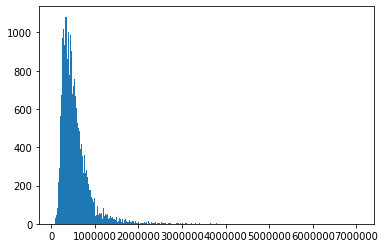

In [50]:
plt.hist(df.price, bins = 'auto'); plt.show()

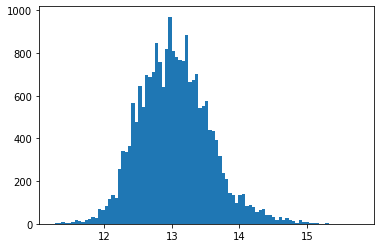

In [51]:
log_df = pd.DataFrame([])
log_price = np.log(df.price)
log_df['log_price'] = log_price
plt.hist(log_price, bins = 'auto'); plt.show()

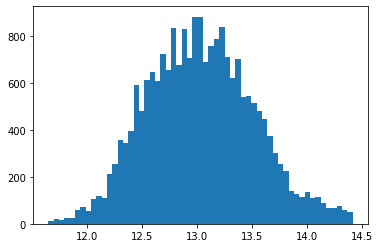

In [52]:
inlier_log_price, lower_price, upper_price = inlier(log_price, thresh = True)
plt.hist(inlier_log_price, bins = 'auto'); plt.show()

In [53]:
# Data Loss Check
loss_check(df.price, inlier(df.price))
loss_check(log_price, inlier(log_price))

Original data: 21549
Number of Data Loss 1136
/ % of data loss 5.27 %
Original data: 21549
Number of Data Loss 317
/ % of data loss 1.47 %


Log transformation not only centralized the data, but also helped to minimize the data loss as as I was removing the outliers.

I will iterate the step to clean up the rest of the non-categorical data and check the data loss.

In [54]:
non_cat_log_df = pd.DataFrame([])
for column in non_cat:
    non_cat_log_df['log_'+column] = np.log(df[column])

In [55]:
non_cat_log_df.head()

,log_sqft_living,log_sqft_lot,log_sqft_above,log_lat,log_long,log_sqft_living15,log_sqft_lot15
0,7.07,8.64,7.07,3.86,nan,7.20,8.64
1,7.85,8.89,7.68,3.87,nan,7.43,8.94
2,6.65,9.21,6.65,3.87,nan,7.91,8.99
3,7.58,8.52,6.96,3.86,nan,7.22,8.52
4,7.43,9.00,7.43,3.86,nan,7.50,8.92


'sqft_basement' and 'long' has faced an error because it was containing negative and zero values.

For 'long' column I will convert it to absolute value and then log the data then convert back to negative!

In [56]:
non_cat_log_df.log_long = -np.log(abs(df.long))
non_cat_log_df.head()

,log_sqft_living,log_sqft_lot,log_sqft_above,log_lat,log_long,log_sqft_living15,log_sqft_lot15
0,7.07,8.64,7.07,3.86,-4.81,7.20,8.64
1,7.85,8.89,7.68,3.87,-4.81,7.43,8.94
2,6.65,9.21,6.65,3.87,-4.81,7.91,8.99
3,7.58,8.52,6.96,3.86,-4.81,7.22,8.52
4,7.43,9.00,7.43,3.86,-4.80,7.50,8.92


Next I will be checking and compare between original data and cleaned up data. 

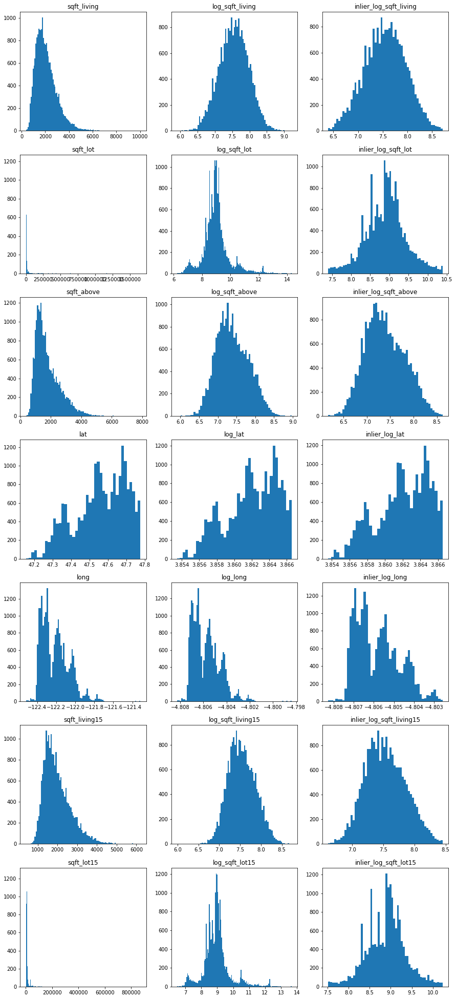

In [57]:
rows = len(non_cat)
fig, ax = plt.subplots(nrows=rows, ncols=3, figsize=[3*5,rows*5], squeeze=False)
for i in range(rows):
    column = non_cat_price[i]
    ax[i][0].hist(df[column], bins='auto')
    ax[i][0].set_title(column)
    
    ax[i][1].hist(non_cat_log_df['log_'+column], bins='auto')
    ax[i][1].set_title('log_'+column)
    ax[i][2].hist(inlier(non_cat_log_df['log_'+column]), bins='auto')
    ax[i][2].set_title('inlier_log_'+column)
plt.show()

By centralizing the data, I can see observe some data loss from taking out the outliers. I will compare the results and see what impact it has to results

In [58]:
log_df = pd.concat((log_df, non_cat_log_df),axis=1)

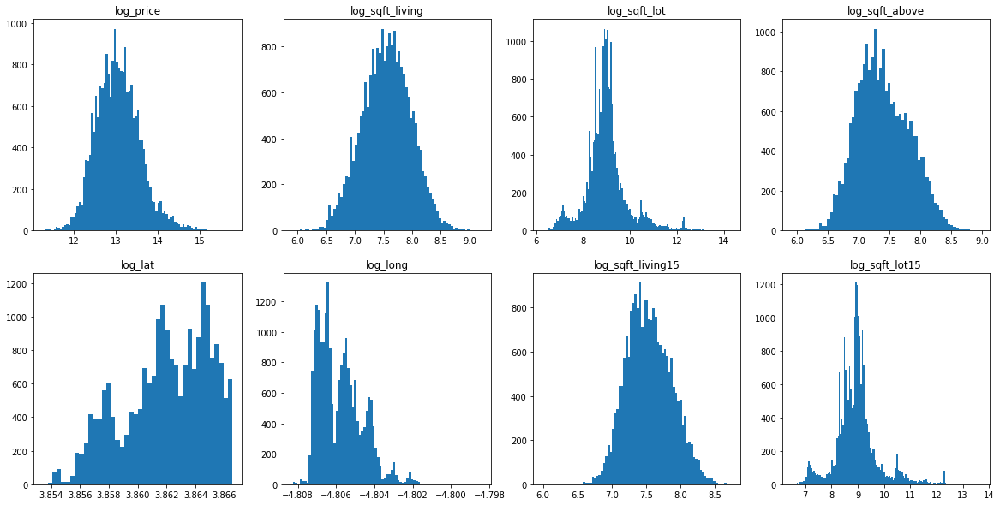

In [59]:
rows = len(log_df.columns)//4
if len(log_df.columns)%4 >0: rows += 1
fig, ax = plt.subplots(nrows=rows, ncols=4, figsize=[20,10])
for i in range(len(log_df.columns)):
    ax[i//4][i%4].hist(log_df[log_df.columns[i]], bins='auto')
    ax[i//4][i%4].set_title(log_df.columns[i])
plt.show()

In [60]:
inlier_log_df= log_df.copy()

In [61]:
inlier_log_df

,log_price,log_sqft_living,log_sqft_lot,log_sqft_above,log_lat,log_long,log_sqft_living15,log_sqft_lot15
0,12.31,7.07,8.64,7.07,3.86,-4.81,7.20,8.64
1,13.20,7.85,8.89,7.68,3.87,-4.81,7.43,8.94
2,12.10,6.65,9.21,6.65,3.87,-4.81,7.91,8.99
3,13.31,7.58,8.52,6.96,3.86,-4.81,7.22,8.52
4,13.14,7.43,9.00,7.43,3.86,-4.80,7.50,8.92
...,...,...,...,...,...,...,...,...
21592,12.79,7.33,7.03,7.33,3.86,-4.81,7.33,7.32
21593,12.90,7.75,8.67,7.75,3.86,-4.81,7.51,8.88
21594,12.90,6.93,7.21,6.93,3.86,-4.81,6.93,7.60
21595,12.90,7.38,7.78,7.38,3.86,-4.80,7.25,7.16


In [62]:
for column in inlier_log_df.columns:
    cleaned, lower, upper = inlier(inlier_log_df[column], thresh = True)
    inlier_log_df = inlier_log_df.loc[inlier_log_df[column] <= upper]
    inlier_log_df = inlier_log_df.loc[inlier_log_df[column] >= lower]
    
inlier_log_df.head()

,log_price,log_sqft_living,log_sqft_lot,log_sqft_above,log_lat,log_long,log_sqft_living15,log_sqft_lot15
0,12.31,7.07,8.64,7.07,3.86,-4.81,7.20,8.64
1,13.20,7.85,8.89,7.68,3.87,-4.81,7.43,8.94
2,12.10,6.65,9.21,6.65,3.87,-4.81,7.91,8.99
3,13.31,7.58,8.52,6.96,3.86,-4.81,7.22,8.52
4,13.14,7.43,9.00,7.43,3.86,-4.80,7.50,8.92


In [63]:
len(inlier_log_df)

17707

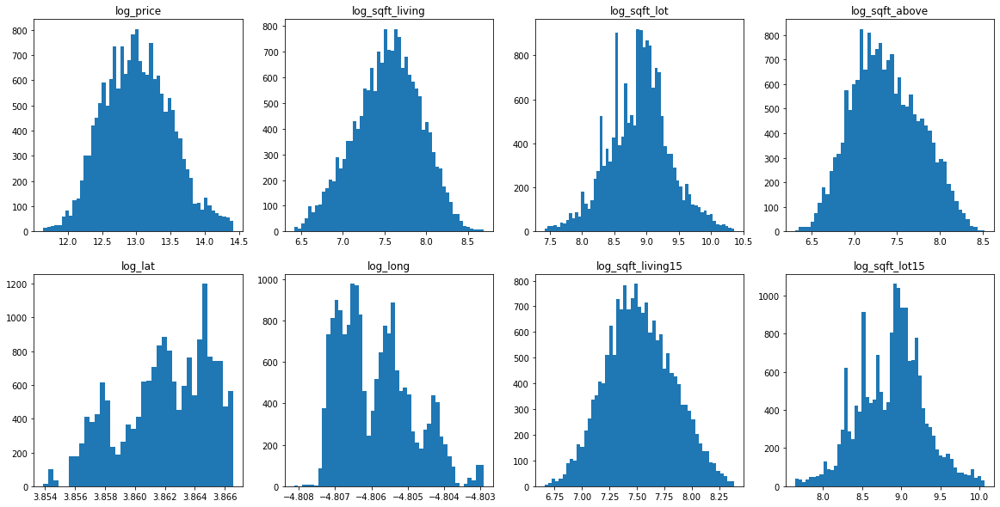

In [64]:
rows = len(inlier_log_df.columns)//4
if len(inlier_log_df.columns)%4 >0: rows += 1
fig, ax = plt.subplots(nrows=rows, ncols=4, figsize=[20,10])
for i in range(len(inlier_log_df.columns)):
    ax[i//4][i%4].hist(inlier_log_df[inlier_log_df.columns[i]], bins='auto')
    ax[i//4][i%4].set_title(inlier_log_df.columns[i])
plt.show()

Though there were some data loss occured, I have the data being centralized.

In [65]:
def min_max_scale(input_list):
    '''input_list is a np array
    returns the min-max scaled array'''
    scaled_list = (input_list - min(input_list))/(max(input_list)-min(input_list))
    return scaled_list

In [66]:
df_scaled = pd.DataFrame([])
columns = non_cat_price
for column in columns:
    df_scaled[column] = min_max_scale(df[column])
df_scaled

,sqft_living,sqft_lot,sqft_above,lat,long,sqft_living15,sqft_lot15,price
0,0.08,0.00,0.11,0.57,0.22,0.16,0.01,0.02
1,0.23,0.00,0.24,0.91,0.17,0.22,0.01,0.07
2,0.04,0.01,0.05,0.94,0.24,0.40,0.01,0.01
3,0.16,0.00,0.09,0.59,0.10,0.17,0.00,0.08
4,0.14,0.00,0.17,0.74,0.39,0.24,0.01,0.06
...,...,...,...,...,...,...,...,...
21592,0.12,0.00,0.15,0.87,0.14,0.19,0.00,0.04
21593,0.20,0.00,0.26,0.57,0.13,0.25,0.01,0.05
21594,0.07,0.00,0.09,0.71,0.18,0.11,0.00,0.05
21595,0.13,0.00,0.16,0.61,0.37,0.17,0.00,0.05


In [67]:
log_df_scaled = pd.DataFrame([])
columns = log_df.columns
for column in columns:
    log_df_scaled[column] = min_max_scale(log_df[column])
log_df_scaled

,log_price,log_sqft_living,log_sqft_lot,log_sqft_above,log_lat,log_long,log_sqft_living15,log_sqft_lot15
0,0.23,0.35,0.30,0.38,0.57,0.22,0.44,0.30
1,0.43,0.59,0.33,0.58,0.91,0.17,0.53,0.34
2,0.19,0.22,0.37,0.24,0.94,0.24,0.70,0.35
3,0.45,0.51,0.28,0.34,0.59,0.10,0.45,0.28
4,0.42,0.46,0.34,0.49,0.74,0.39,0.55,0.34
...,...,...,...,...,...,...,...,...
21592,0.34,0.43,0.10,0.46,0.87,0.14,0.49,0.12
21593,0.36,0.55,0.30,0.60,0.57,0.13,0.55,0.33
21594,0.36,0.31,0.12,0.33,0.71,0.18,0.34,0.16
21595,0.36,0.44,0.19,0.48,0.61,0.37,0.46,0.09


In [68]:
inlier_log_df_scaled = pd.DataFrame([])
columns = inlier_log_df.columns
for column in columns:
    inlier_log_df_scaled[column] = min_max_scale(inlier_log_df[column])
inlier_log_df_scaled

,log_price,log_sqft_living,log_sqft_lot,log_sqft_above,log_lat,log_long,log_sqft_living15,log_sqft_lot15
0,0.24,0.29,0.41,0.34,0.56,0.38,0.31,0.41
1,0.56,0.63,0.50,0.62,0.91,0.29,0.45,0.54
2,0.16,0.10,0.61,0.15,0.93,0.42,0.72,0.56
3,0.60,0.51,0.37,0.29,0.57,0.17,0.32,0.36
4,0.54,0.45,0.54,0.50,0.73,0.72,0.48,0.53
...,...,...,...,...,...,...,...,...
21586,0.24,0.40,0.67,0.45,0.22,0.78,0.30,0.70
21587,0.54,0.58,0.41,0.64,0.60,0.97,0.62,0.42
21589,0.61,0.62,0.44,0.69,0.56,0.53,0.68,0.44
21590,0.79,0.77,0.50,0.70,0.63,0.16,0.56,0.45


In [69]:
inlier_log_df_scaled.columns

Index(['log_price', 'log_sqft_living', 'log_sqft_lot', 'log_sqft_above',
       'log_lat', 'log_long', 'log_sqft_living15', 'log_sqft_lot15'],
      dtype='object')

## 2.3 Data Regression

In [70]:
cat_price_df = pd.concat([df.price, cat_df], axis=1, join='inner')
cat_price_df

,price,bedr_2,bedr_3,bedr_4,bedr_5,bedr_6,bedr_7,bath_0.75,bath_1.0,bath_1.25,...,sold_4,sold_5,sold_6,sold_7,sold_8,sold_9,sold_10,sold_11,sold_12,base_1
0,221900.00,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
1,538000.00,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
2,180000.00,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,604000.00,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
4,510000.00,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,360000.00,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
21593,400000.00,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21594,402101.00,1,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
21595,400000.00,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [71]:
def poly_regression(X, y, test_size = 0.2, degree = 20):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, random_state=42)
    linreg=LinearRegression()
    linreg.fit(X_train, y_train)
    
    lm_train_predictions = linreg.predict(X_train)
    lm_test_predictions = linreg.predict(X_test)

    result = pd.DataFrame([], columns=['degree', 'r2_score'])
    degrees = []
    r2_scores = [] 
    for index, degree in enumerate(range(degree)):

        # Instantiate PolynomialFeatures
        poly = PolynomialFeatures(degree = degree)

        # Fit and transform X_train
        X_poly_train = poly.fit_transform(X_train)

        # Instantiate and fit a linear regression model to the polynomial transformed train features
        reg_poly = LinearRegression().fit(X_poly_train, y_train)

        # Transform the test data into polynomial features
        X_poly_test = poly.fit_transform(X_test)

        # Get predicted values for transformed polynomial test data  
        y_pred = reg_poly.predict(X_poly_test)

        # Evaluate model performance on test data
        degrees.append(degree)
        r2_scores.append(round(r2_score(y_test, y_pred),5))
        if(r2_score(y_test, y_pred) < -1): break

    result.degree = degrees
    result.r2_score = r2_scores
    display(result)

    max_r2 = result.loc[result.r2_score == max(r2_scores)]
    return print('Degree', r2_scores.index(max(r2_scores)),'with the highest r2 score of ', max(r2_scores))

In [72]:
def cross_val(X, y, fold=10, degree = 1):
    regression = LinearRegression()
    crossvalidation = KFold(n_splits=fold, shuffle=True, random_state=1)
    baseline = np.mean(cross_val_score(regression,X,y, scoring='r2',cv = crossvalidation))
    return print('Cross Validation Accuracy: ', baseline)

In [73]:
y = cat_price_df.price
X = cat_price_df.drop('price', axis=1)
poly_regression(X,y, degree=2)
cross_val(X,y)

,degree,r2_score
0,0,-0.00
1,1,0.80


Degree 1 with the highest r2 score of  0.80118
Cross Validation Accuracy:  -8.327590737361972e+18


In [74]:
y = df_scaled.price
X = df_scaled.drop('price', axis=1)
poly_regression(X,y, test_size = .2)
cross_val(X,y)

,degree,r2_score
0,0,-0.00
1,1,0.60
2,2,0.71
3,3,0.75
4,4,0.60
5,5,-2168.68


Degree 3 with the highest r2 score of  0.74729
Cross Validation Accuracy:  0.589310368614202


In [75]:
y = log_df_scaled.log_price
X = log_df_scaled.drop('log_price', axis=1)
poly_regression(X,y, test_size = .25)
cross_val(X,y)

,degree,r2_score
0,0,-0.00
1,1,0.67
2,2,0.75
3,3,0.81
4,4,0.82
5,5,0.65
6,6,-5.47


Degree 4 with the highest r2 score of  0.81885
Cross Validation Accuracy:  0.6665412737700458


In [76]:
y = inlier_log_df_scaled.log_price
X = inlier_log_df_scaled.drop('log_price', axis=1)
poly_regression(X,y, degree=8)
cross_val(X,y)

,degree,r2_score
0,0,-0.00
1,1,0.66
2,2,0.74
3,3,0.81
4,4,0.82
5,5,0.83
6,6,0.73
7,7,-0.83


Degree 5 with the highest r2 score of  0.82887
Cross Validation Accuracy:  0.6644654403669886


In [77]:
regress_df = pd.concat([df_scaled, cat_df], axis=1, join='inner')
log_regress_df = pd.concat([log_df_scaled, cat_df], axis = 1, join='inner')
inlier_regress_df = pd.concat([inlier_log_df_scaled, cat_df], axis =1, join='inner')

Testing regression with combined df!

In [78]:
y = regress_df.price
X = regress_df.drop('price', axis=1)
poly_regression(X,y, degree=2)
cross_val(X,y)

,degree,r2_score
0,0,-0.00
1,1,0.83


Degree 1 with the highest r2 score of  0.82744
Cross Validation Accuracy:  -7.1811302195238616e+16


In [79]:
y = log_regress_df.log_price
X = log_regress_df.drop('log_price', axis=1)
poly_regression(X,y, degree=2)
cross_val(X,y)

,degree,r2_score
0,0,-0.00
1,1,0.89


Degree 1 with the highest r2 score of  0.88822
Cross Validation Accuracy:  -5.988217808590684e+18


In [80]:
y = inlier_regress_df.log_price
X = inlier_regress_df.drop('log_price', axis=1)
poly_regression(X,y,degree=2)
cross_val(X,y)

,degree,r2_score
0,0,-0.00
1,1,0.88


Degree 1 with the highest r2 score of  0.88496
Cross Validation Accuracy:  -3.097653589793251e+17


To check and see multicollinearity that exist I will check correlations.

## 2.4 Key Features

In [81]:
def key_feature(X,y):
    est = sm.OLS(y, X).fit()
    pvalues = pd.DataFrame(est.pvalues, columns=['p'])
    pvalues = pvalues.sort_values(by='p', ascending=True)
    features = list(pvalues[pvalues.p < 0.05].index)
    return features

In [82]:
y = regress_df.price
X = regress_df.drop('price', axis=1)
X = regress_df[key_feature(X,y)]
poly_regression(X,y, degree=2)
cross_val(X,y)

,degree,r2_score
0,0,-0.00
1,1,0.82


Degree 1 with the highest r2 score of  0.81759
Cross Validation Accuracy:  0.8138726668025656


In [83]:
y = log_regress_df.log_price
X = log_regress_df.drop('log_price', axis=1)
X = log_regress_df[key_feature(X,y)]
poly_regression(X,y, degree=2)
cross_val(X,y)

,degree,r2_score
0,0,-0.00
1,1,0.88


Degree 1 with the highest r2 score of  0.88268
Cross Validation Accuracy:  0.8790374663930998


In [84]:
y = inlier_regress_df.log_price
X = inlier_regress_df.drop('log_price', axis=1)
X = inlier_regress_df[key_feature(X,y)]
poly_regression(X,y,degree=2)
cross_val(X,y)

,degree,r2_score
0,0,-0.00
1,1,0.87


Degree 1 with the highest r2 score of  0.87406
Cross Validation Accuracy:  0.8741093226288141


## 2.5 Multicollinearity!

In [85]:
def multicol(df):
    # save absolute value of correlation matrix as a data frame
    # converts all values to absolute value
    # stacks the row:column pairs into a multindex
    # reset the index to set the multindex to seperate columns
    # sort values. 0 is the column automatically generated by the stacking

    df_pred=df.corr().abs().stack().reset_index().sort_values(0, ascending=False)

    # zip the variable name columns (Which were only named level_0 and level_1 by default) in a new column named "pairs"
    df_pred['pairs'] = list(zip(df_pred.level_0, df_pred.level_1))

    # set index to pairs
    df_pred.set_index(['pairs'], inplace = True)

    # drop level columns
    df_pred.drop(columns=['level_1', 'level_0'], inplace = True)

    # rename correlation column as cc rather than 0
    df_pred.columns = ['cc']

    # drop duplicates.
    df_pred.drop_duplicates(inplace=True)
    return df_pred[(df_pred.cc>.75) & (df_pred.cc <1)]

In [86]:
def p_value(X,y):
    est = sm.OLS(y, X).fit()
    pvalues = pd.DataFrame(est.pvalues, columns=['p'])
    return pvalues

In [87]:
def ols_summary(X,y):
    X_interact = sm.add_constant(X)
    model = sm.OLS(y,X_interact)
    results = model.fit()
    return results.summary()

In [88]:
multicol(regress_df.drop('price', axis=1))

,cc
pairs,
"(sqft_living, sqft_above)",0.87
"(cond_4, cond_3)",0.81
"(sqft_living, sqft_living15)",0.76


Deciding which column to drop. We will drop the column with higher p_value.

In [89]:
y = regress_df.price
X = regress_df.drop('price', axis=1)
regress_p_values = p_value(X,y)
regress_p_values.loc[['sqft_living', 'sqft_above', 'cond_4', 'cond_3', 
                      'sqft_living15']].sort_values(by='p', ascending=True)

,p
sqft_living,0.00
sqft_above,0.00
sqft_living15,0.00
cond_4,0.00
cond_3,0.00


In [90]:
regress_df = regress_df.drop(['cond_3' , 'sqft_living15', 'sqft_above'], axis=1)
y = regress_df.price
X = regress_df.drop('price', axis=1)
print('Key Features are', key_feature(X,y)[:8])
X = regress_df[key_feature(X,y)]
poly_regression(X,y, degree=2)
cross_val(X,y)
ols_summary(X,y)

Key Features are ['sqft_living', 'view_4.0', 'zipc_98039', 'zipc_98004', 'zipc_98040', 'zipc_98112', 'view_3.0', 'zipc_98105']


,degree,r2_score
0,0,-0.00
1,1,0.82


Degree 1 with the highest r2 score of  0.82106
Cross Validation Accuracy:  0.818196647185663


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.823
Model:                            OLS   Adj. R-squared:                  0.822
Method:                 Least Squares   F-statistic:                     713.3
Date:                Tue, 16 Jun 2020   Prob (F-statistic):               0.00
Time:                        00:40:47   Log-Likelihood:                 52387.
No. Observations:               21549   AIC:                        -1.045e+05
Df Residuals:                   21408   BIC:                        -1.034e+05
Df Model:                         140                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          -0.0066      0.002     -3.650      0.000      -0.010      -0.003
sqft_living     0.2473      0.003     95.575      0.000       0.242       0.252
view_4.0        0.0796      0.001     62.660      0.000       0.077       0.082
zipc_98039      0.1626      0.003     47.615      0.000       0.156       0.169
zipc_98004      0.1051      0.002     59.038      0.000       0.102       0.109
zipc_98040      0.0703      0.002     42.349      0.000       0.067       0.074
zipc_98112      0.0832      0.002     45.213      0.000       0.080       0.087
view_3.0        0.0258      0.001     25.754      0.000       0.024       0.028
zipc_98105      0.0610      0.002     30.031      0.000       0.057       0.065
zipc_98119      0.0602      0.002     29.073      0.000       0.056       0.064
zipc_98109      0.0636      0.002     26.167      0.000       0.059       0.068
view_2.0        0.0127      0.001     17.300      0.000       0.011       0.014
zipc_98102      0.0604      0.002     24.177      0.000       0.055       0.065
cond_5          0.0085      0.001     14.672      0.000       0.007       0.010
grad_13         0.1569      0.007     21.137      0.000       0.142       0.171
zipc_98122      0.0435      0.002     24.926      0.000       0.040       0.047
zipc_98033      0.0459      0.002     23.944      0.000       0.042       0.050
zipc_98199      0.0451      0.002     24.574      0.000       0.042       0.049
zipc_98005      0.0437      0.002     20.422      0.000       0.039       0.048
zipc_98006      0.0351      0.002     23.022      0.000       0.032       0.038
zipc_98008      0.0358      0.002     18.375      0.000       0.032       0.040
view_1.0        0.0146      0.001     12.005      0.000       0.012       0.017
base_1         -0.0050      0.000    -13.267      0.000      -0.006      -0.004
zipc_98144      0.0314      0.002     19.793      0.000       0.028       0.034
zipc_98029      0.0351      0.002     17.529      0.000       0.031       0.039
grad_12         0.0994      0.003     38.254      0.000       0.094       0.104
zipc_98103      0.0373      0.002     21.540      0.000       0.034       0.041
zipc_98115      0.0366      0.002     20.837      0.000       0.033       0.040
zipc_98107      0.0377      0.002     19.036      0.000       0.034       0.042
zipc_98007      0.0347      0.002     15.195      0.000       0.030       0.039
zipc_98116      0.0294      0.002     18.310      0.000       0.026       0.033
zipc_98027      0.0259      0.002     15.192      0.000       0.023       0.029
zipc_98136      0.0264      0.002     16.243      0.000       0.023       0.030
zipc_98052      0.0319      0.002     16.166      0.000       0.028       0.036
zipc_98075      0.0283      0.002     14.103      0.000       0.024       0.032
zipc_98117      0.0323      0.002     18.06

In [91]:
multicol(log_regress_df.drop('log_price', axis=1))

,cc
pairs,
"(log_sqft_lot15, log_sqft_lot)",0.92
"(log_sqft_above, log_sqft_living)",0.86
"(cond_4, cond_3)",0.81


In [92]:
y = log_regress_df.log_price
X = log_regress_df.drop('log_price', axis=1)
regress_p_values = p_value(X,y)
regress_p_values.loc[['log_sqft_lot', 'log_sqft_lot15', 'log_sqft_above', 'log_sqft_living', 
                      'cond_4', 'cond_3']].sort_values(by='p', ascending=True)

,p
log_sqft_lot,0.00
log_sqft_living,0.00
log_sqft_above,0.00
cond_4,0.00
cond_3,0.00
log_sqft_lot15,0.02


In [93]:
log_regress_df = log_regress_df.drop(['log_sqft_lot15', 'log_sqft_above', 'cond_3'], axis=1)
y = log_regress_df.log_price
X = log_regress_df.drop('log_price', axis=1)
print('Key Features are', key_feature(X,y)[:8])
X = log_regress_df[key_feature(X,y)]
poly_regression(X,y, degree=2)
cross_val(X,y)
ols_summary(X,y)

Key Features are ['log_sqft_living', 'view_4.0', 'zipc_98004', 'zipc_98040', 'log_sqft_lot', 'zipc_98112', 'zipc_98039', 'zipc_98119']


,degree,r2_score
0,0,-0.00
1,1,0.88


Degree 1 with the highest r2 score of  0.88249
Cross Validation Accuracy:  0.8793195206280704


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.882
Model:                            OLS   Adj. R-squared:                  0.881
Method:                 Least Squares   F-statistic:                     895.8
Date:                Tue, 16 Jun 2020   Prob (F-statistic):               0.00
Time:                        00:40:55   Log-Likelihood:                 38806.
No. Observations:               21549   AIC:                        -7.725e+04
Df Residuals:                   21370   BIC:                        -7.583e+04
Df Model:                         178                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -0.0123      0.021     -0.594      0.552      -0.053       0.028
log_sqft_living       0.3152      0.005     65.775      0.000       0.306       0.325
view_4.0              0.1071      0.002     44.409      0.000       0.102       0.112
zipc_98004            0.2352      0.004     59.243      0.000       0.227       0.243
zipc_98040            0.1877      0.004     52.067      0.000       0.181       0.195
log_sqft_lot          0.1270      0.004     32.946      0.000       0.119       0.135
zipc_98112            0.2126      0.004     53.024      0.000       0.205       0.220
zipc_98039            0.2687      0.007     39.820      0.000       0.255       0.282
zipc_98119            0.1879      0.004     42.498      0.000       0.179       0.197
zipc_98109            0.1935      0.005     38.578      0.000       0.184       0.203
zipc_98122            0.1649      0.004     43.437      0.000       0.157       0.172
zipc_98102            0.1947      0.005     38.067      0.000       0.185       0.205
zipc_98105            0.1842      0.004     41.640      0.000       0.176       0.193
zipc_98006            0.1409      0.004     39.702      0.000       0.134       0.148
zipc_98116            0.1346      0.004     38.444      0.000       0.128       0.142
zipc_98005            0.1575      0.005     34.223      0.000       0.148       0.167
zipc_98136            0.1244      0.003     36.105      0.000       0.118       0.131
zipc_98029            0.1498      0.005     31.558      0.000       0.140       0.159
zipc_98199            0.1552      0.004     38.085      0.000       0.147       0.163
zipc_98008            0.1474      0.004     33.383      0.000       0.139       0.156
zipc_98144            0.1292      0.003     37.171      0.000       0.122       0.136
view_3.0              0.0439      0.002     23.076      0.000       0.040       0.048
zipc_98027            0.1246      0.004     30.720      0.000       0.117       0.133
zipc_98033            0.1548      0.004     35.291      0.000       0.146       0.163
zipc_98103            0.1540      0.004     38.775      0.000       0.146       0.162
zipc_98107            0.1566      0.004     35.984      0.000       0.148       0.165
zipc_98115            0.1508      0.004     37.425      0.000       0.143       0.159
cond_5                0.0215      0.001     19.562      0.000       0.019       0.024
zipc_98007            0.1447      0.005     29.582      0.000       0.135       0.154
zipc_98075            0.1303      0.005     27.508      0.000       0.121       0.140
zipc_98117            0.1414      0.004     34.551      0.000       0.133       0.149
log_sqft_living15     0.0968      0.004     23.764      0.000       0.089       0.105
zipc_98074            0.1267      0.005     26.753      0.000       0.117

In [94]:
multicol(inlier_regress_df.drop('log_price', axis=1))

,cc
pairs,
"(log_sqft_lot, log_sqft_lot15)",0.87
"(log_sqft_above, log_sqft_living)",0.84
"(cond_3, cond_4)",0.81


In [95]:
y = inlier_regress_df.log_price
X = inlier_regress_df.drop('log_price', axis=1)
regress_p_values = p_value(X,y)
regress_p_values.loc[['log_sqft_lot', 'log_sqft_lot15', 'log_sqft_above', 'log_sqft_living', 
                      'cond_4', 'cond_3']].sort_values(by='p', ascending=True)

,p
log_sqft_living,0.00
log_sqft_above,0.00
log_sqft_lot,0.00
cond_4,0.00
cond_3,0.00
log_sqft_lot15,0.93


In [96]:
inlier_regress_df = inlier_regress_df.drop(['log_sqft_lot15', 'log_sqft_above', 'cond_3'], axis=1)
y = inlier_regress_df.log_price
X = inlier_regress_df.drop('log_price', axis=1)
print('Key Features are', key_feature(X,y)[:8])
X = inlier_regress_df[key_feature(X,y)]
poly_regression(X,y, degree=2)
cross_val(X,y)
ols_summary(X,y)

Key Features are ['log_sqft_living', 'zipc_98004', 'zipc_98040', 'view_4.0', 'zipc_98112', 'zipc_98119', 'zipc_98039', 'zipc_98109']


,degree,r2_score
0,0,-0.00
1,1,0.88


Degree 1 with the highest r2 score of  0.88433
Cross Validation Accuracy:  0.8835639579946225


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.886
Model:                            OLS   Adj. R-squared:                  0.885
Method:                 Least Squares   F-statistic:                     903.7
Date:                Tue, 16 Jun 2020   Prob (F-statistic):               0.00
Time:                        00:41:01   Log-Likelihood:                 24657.
No. Observations:               17707   AIC:                        -4.901e+04
Df Residuals:                   17555   BIC:                        -4.783e+04
Df Model:                         151                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.0391      0.007      5.877      0.000       0.026       0.052
log_sqft_living       0.3152      0.005     63.474      0.000       0.305       0.325
zipc_98004            0.3822      0.010     40.144      0.000       0.364       0.401
zipc_98040            0.3093      0.008     37.837      0.000       0.293       0.325
view_4.0              0.1528      0.005     33.369      0.000       0.144       0.162
zipc_98112            0.3409      0.010     34.284      0.000       0.321       0.360
zipc_98119            0.3248      0.011     30.290      0.000       0.304       0.346
zipc_98039            0.4472      0.016     28.064      0.000       0.416       0.478
zipc_98109            0.3298      0.011     29.283      0.000       0.308       0.352
zipc_98105            0.3080      0.011     28.427      0.000       0.287       0.329
zipc_98122            0.2719      0.009     28.717      0.000       0.253       0.290
zipc_98116            0.2395      0.008     28.388      0.000       0.223       0.256
zipc_98136            0.2227      0.008     28.308      0.000       0.207       0.238
zipc_98006            0.2227      0.008     27.494      0.000       0.207       0.239
zipc_98199            0.2778      0.010     27.109      0.000       0.258       0.298
zipc_98102            0.3206      0.012     26.064      0.000       0.297       0.345
zipc_98005            0.2635      0.010     26.048      0.000       0.244       0.283
zipc_98103            0.2773      0.011     26.085      0.000       0.256       0.298
zipc_98144            0.2186      0.009     25.139      0.000       0.202       0.236
zipc_98107            0.2729      0.011     24.508      0.000       0.251       0.295
zipc_98115            0.2557      0.011     23.794      0.000       0.235       0.277
zipc_98033            0.2544      0.011     23.241      0.000       0.233       0.276
cond_5                0.0391      0.002     22.495      0.000       0.036       0.042
zipc_98117            0.2512      0.011     23.130      0.000       0.230       0.273
zipc_98008            0.2313      0.010     23.335      0.000       0.212       0.251
view_3.0              0.0710      0.003     21.263      0.000       0.064       0.078
zipc_98027            0.2107      0.009     23.691      0.000       0.193       0.228
zipc_98126            0.1812      0.008     23.498      0.000       0.166       0.196
zipc_98007            0.2270      0.010     21.957      0.000       0.207       0.247
zipc_98029            0.2141      0.010     21.984      0.000       0.195       0.233
zipc_98118            0.1508      0.007     20.935      0.000       0.137       0.165
zipc_98052            0.2116      0.011     19.012      0.000       0.190       0.233
view_2.0              0.0412      0.002     17.472      0.000       0.037

Our goal for this project is to find the correlation between price and other features.

After reviewing coefficients, I was able to come to conclusion that size of living, location, and grades are the most important factors to the price of the house. I would like to see how much impact there is with these features by visualizing the result.

# 3. Visualization

## 3.1 Data Visuallization - Price vs Location

First, I have observed high coefficiency and low p-value in lat and long. So, I will be looking at the price variance depends on the lat and long of the housese.

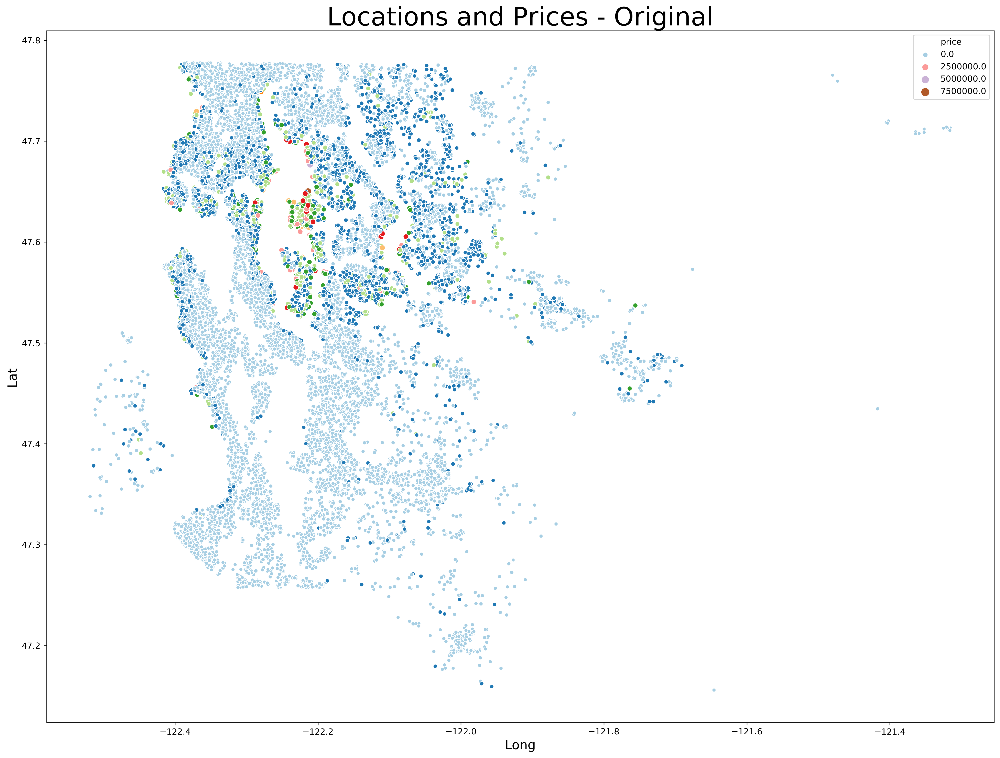

In [97]:
plt.figure(figsize=(20,15), dpi=300)
sns.scatterplot(df.long, df.lat, hue=df.price, size=df.price, palette='Paired')
plt.title('Locations and Prices - Original', fontdict={'fontsize': 30})
plt.xlabel('Long', fontdict={'fontsize':15})
plt.ylabel('Lat', fontdict={'fontsize':15})
plt.savefig('Locations and Prices - Original', dpi=300)
plt.show()

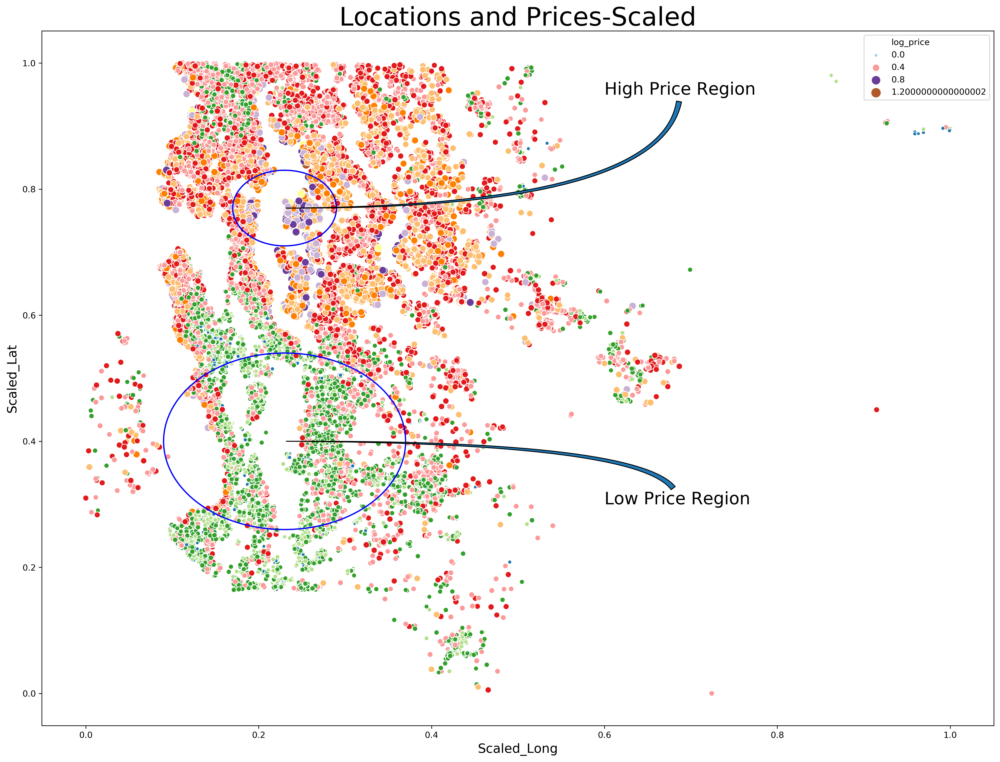

In [264]:
import matplotlib.patches as patches
from matplotlib.patches import Circle

plt.figure(figsize=(20,15), dpi=300)
sns.scatterplot(log_regress_df.log_long, log_regress_df.log_lat,
                hue=log_regress_df.log_price, size=log_regress_df.log_price,
                sizes=(5, 100), palette='Paired')
plt.title('Locations and Prices-Scaled', fontdict={'fontsize': 30})
plt.xlabel('Scaled_Long', fontdict={'fontsize':15})
plt.ylabel('Scaled_Lat', fontdict={'fontsize':15})

plt.annotate('High Price Region', xy=(0.23, 0.77), xytext=(.6, .95),fontsize=20,
            arrowprops=dict(arrowstyle='Wedge', connectionstyle="angle3"))
plt.annotate('Low Price Region', xy=(0.23, 0.4), xytext=(.6, .3),fontsize=20,
            arrowprops=dict(arrowstyle='Wedge', connectionstyle="angle3"))

ax=plt.gca()
r1 = .03; c1 = (.23,.77)
circ1 = patches.Circle(c1,2*r1,lw=1.5,ec='b',fill=False)
ax.add_artist(circ1)
circ1.set_clip_box(ax.bbox)

r2= .07; c2 = (.23,.4)
circ2 = patches.Circle(c2,2*r2,lw=1.5,ec='b',fill=False)
ax.add_artist(circ2)
circ2.set_clip_box(ax.bbox)


plt.savefig('Locations and Prices - Scaled', dpi=300)
plt.show()

We can observe the incresing tendency in price of the houses towards the center of the county.

In [100]:
len(df.zipcode.value_counts())

70

There are about 70 different zipcodes in the area.

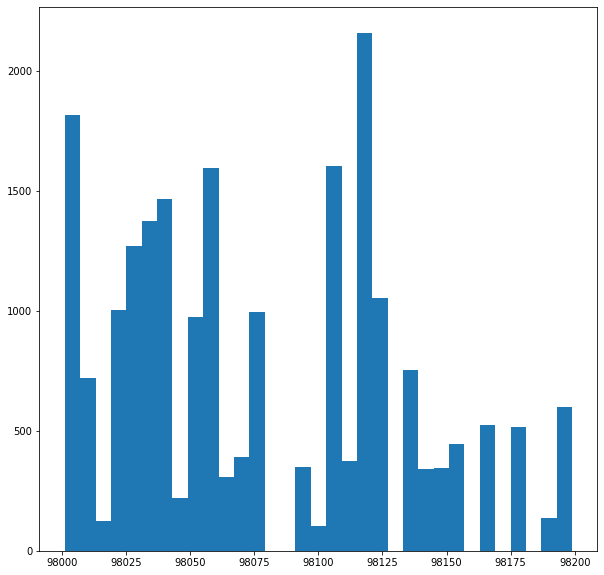

In [101]:
plt.figure(figsize=(10,10))
plt.hist(df['zipcode'], bins='auto');plt.show()

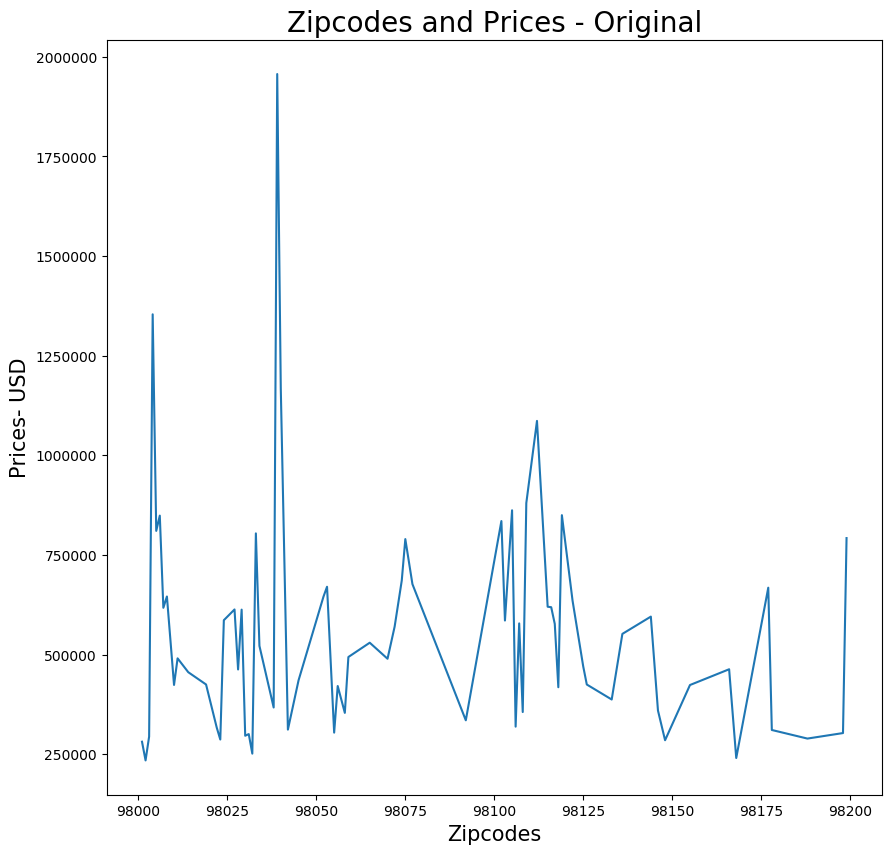

In [198]:
plt.figure(figsize=(10,10), dpi=100)
plt.plot(df.groupby('zipcode')['price'].mean())
plt.title('Zipcodes and Prices - Original', fontdict={'fontsize': 20})
plt.xlabel('Zipcodes', fontdict={'fontsize':15})
plt.ylabel('Prices- USD', fontdict={'fontsize':15})
plt.savefig('Zipcodes and Prices - Original', dpi=300)
plt.show()

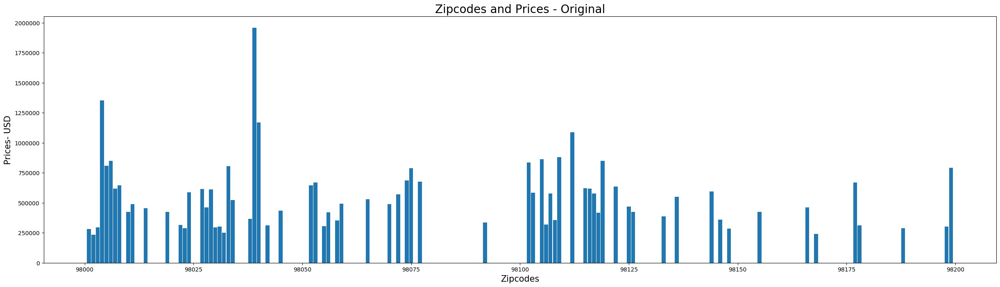

In [233]:
plt.figure(figsize=(30,8), dpi=100)
plt.bar(df.groupby('zipcode')['price'].mean().index,
       df.groupby('zipcode')['price'].mean(),width=.9)
plt.title('Zipcodes and Prices - Original', fontdict={'fontsize': 20})
plt.xlabel('Zipcodes', fontdict={'fontsize':15})
plt.ylabel('Prices- USD', fontdict={'fontsize':15})
plt.savefig('Zipcodes and Prices - Original Bar', dpi=300)
plt.show()

In [110]:
df.groupby('zipcode')['price'].mean().sort_values(ascending=False)[:5]

zipcode
98039   1956702.13
98004   1353720.08
98040   1167801.31
98112   1086234.18
98109    880077.75
Name: price, dtype: float64

Top 5 zipcodes with highest house values are 98039, 98004, 98040, 98112, 98109.

When these zipcodes were compared with Lat and Long, it shows the similar results.

## 3.2 Data Visualization - Price vs. House Size

Next another feature that had high coefficient and low p-value was sqft_living which is the house size.

<Figure size 4000x4000 with 0 Axes>

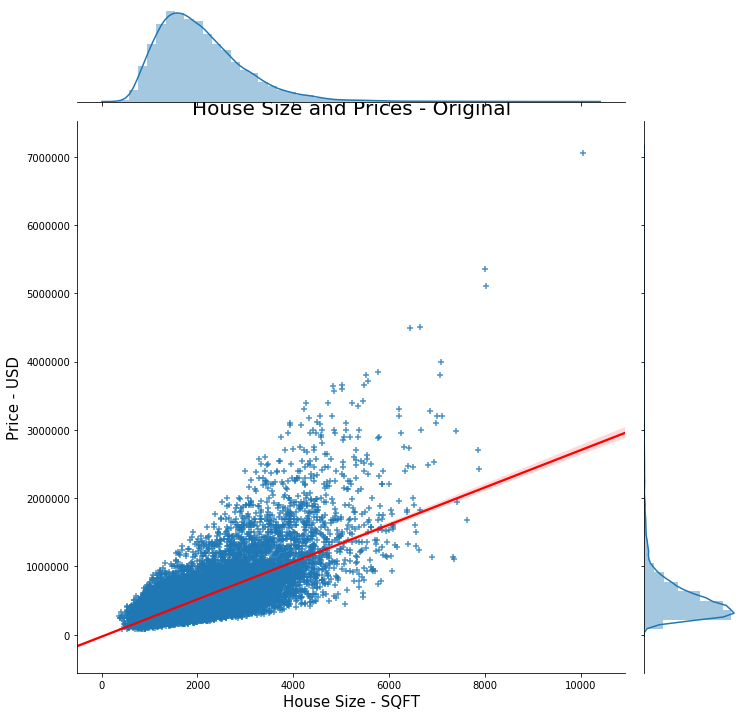

In [162]:
plt.figure(figsize=(20,20), dpi=200)
sns.jointplot('sqft_living','price',data=df, size=10, marker='+',
             kind='reg', label='grade', joint_kws={'line_kws':{'color':'red'}})
plt.title('House Size and Prices - Original', fontdict={'fontsize':20})
plt.xlabel('House Size - SQFT', fontdict={'fontsize':15})
plt.ylabel('Price - USD', fontdict={'fontsize':15})
plt.savefig('House Size and Prices - Original', dpi=300)
plt.show()

<Figure size 4000x4000 with 0 Axes>

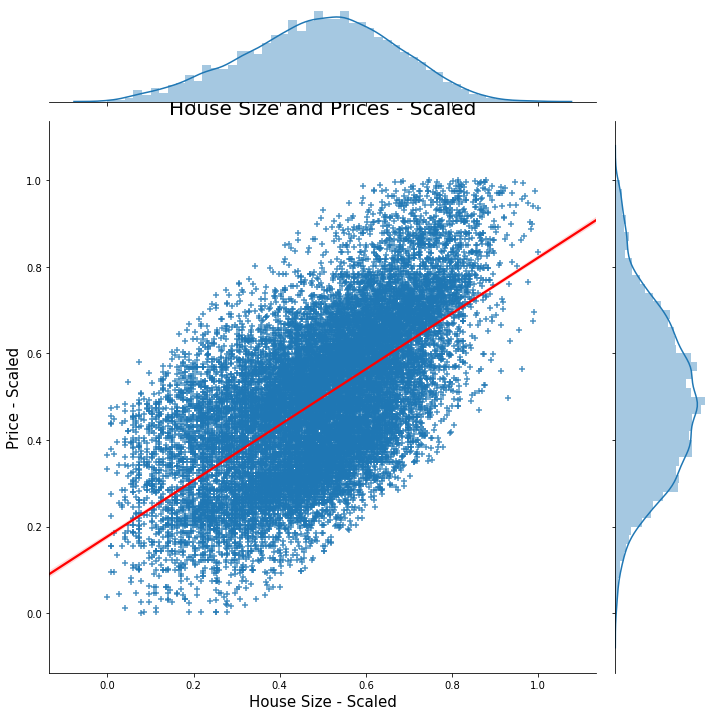

In [164]:
plt.figure(figsize=[20,20], dpi=200)
sns.jointplot('log_sqft_living','log_price', data=inlier_regress_df, size=10, marker='+',
               kind='reg', label='grade', joint_kws={'line_kws':{'color':'red'}})
plt.title('House Size and Prices - Scaled', fontdict={'fontsize':20})
plt.xlabel('House Size - Scaled', fontdict={'fontsize':15})
plt.ylabel('Price - Scaled', fontdict={'fontsize':15})
plt.savefig('House Size and Prices - Scaled', dpi=300)
plt.show()

We can definitely observe a positive correlation between price and sqft_living.

In [241]:
df_98039 = df.loc[df.zipcode==98039]
df_98004 = df.loc[df.zipcode==98004]
df_98040 = df.loc[df.zipcode==98040]
df_98112 = df.loc[df.zipcode==98112]
df_98109 = df.loc[df.zipcode==98109]
high_price_zip_df = pd.concat([df_98039,df_98004,df_98040,df_98112,df_98109])
high_price_zip_df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,view,condition,grade,sqft_above,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,sold_month,basement
2972,2950000.00,4,3.50,4860,23885,2.00,0.00,3,12,4860,1996,98039,47.62,-122.23,3580,16054,8,0
3757,1910000.00,4,3.50,4210,18564,2.00,0.00,3,11,4210,2001,98039,47.62,-122.22,3520,18564,2,0
4073,875000.00,3,1.00,1220,8119,1.00,0.00,4,7,1220,1955,98039,47.63,-122.24,1910,8119,11,0
4074,940000.00,3,1.00,1220,8119,1.00,0.00,4,7,1220,1955,98039,47.63,-122.24,1910,8119,2,0
4145,4000000.00,4,5.50,7080,16573,2.00,0.00,3,12,5760,2008,98039,47.62,-122.22,3140,15996,10,1


<Figure size 4000x4000 with 0 Axes>

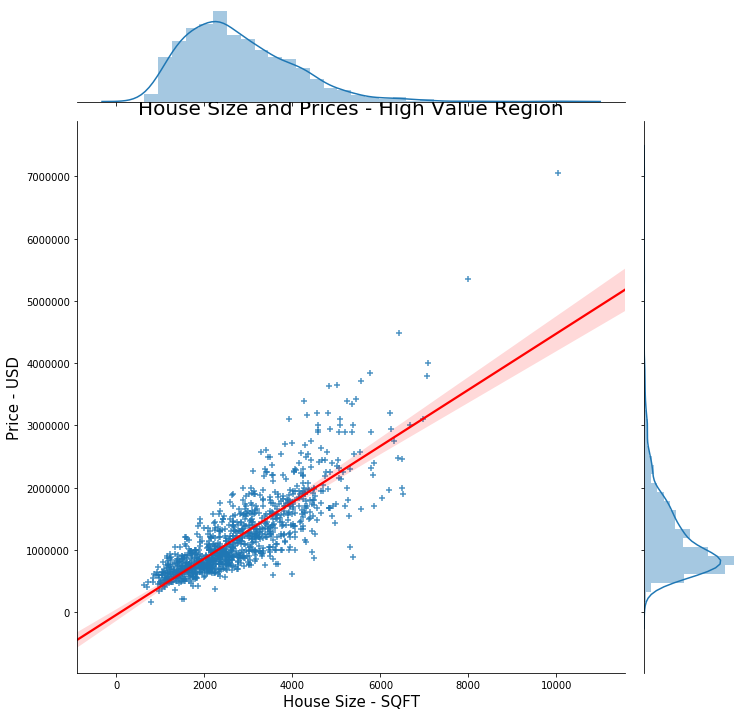

In [251]:
plt.figure(figsize=(20,20), dpi=200)
sns.jointplot('sqft_living','price',data=high_price_zip_df, size=10, marker='+',
             kind='reg', label='grade', joint_kws={'line_kws':{'color':'red'}})
plt.title('House Size and Prices - High Value Region', fontdict={'fontsize':20})
plt.xlabel('House Size - SQFT', fontdict={'fontsize':15})
plt.ylabel('Price - USD', fontdict={'fontsize':15})
plt.savefig('House Size and Prices - High Value Region', dpi=300)
plt.show()

## 3.3 Data Visualization - Price vs. Grades

Last feature I would like to touch up is the price and grades. Some grades had high coefficients and low p-values.

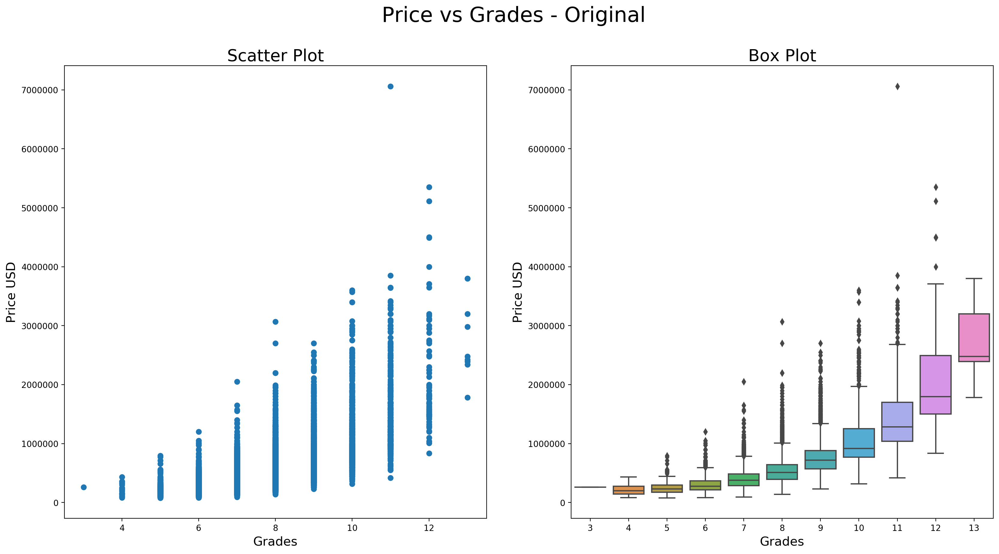

In [186]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=[20,10], dpi=200)

fig.suptitle("Price vs Grades - Original", fontsize=25)

ax[0].scatter(df.grade, df.price)
ax[0].set_title('Scatter Plot',fontdict={'fontsize':20})
ax[0].set_xlabel('Grades', fontdict={'fontsize':15})
ax[0].set_ylabel('Price USD', fontdict={'fontsize':15})

ax[1] = sns.boxplot(df.grade, df.price)
ax[1].set_title('Box Plot',fontdict={'fontsize':20})
ax[1].set_xlabel('Grades', fontdict={'fontsize':15})
ax[1].set_ylabel('Price USD', fontdict={'fontsize':15})

plt.savefig('Grades and Prices - Original', dpi=300)
plt.show()

In [188]:
grade_price_df = pd.concat([df.grade, log_df],axis=1)
grade_price_df.head()

,grade,log_price,log_sqft_living,log_sqft_lot,log_sqft_above,log_lat,log_long,log_sqft_living15,log_sqft_lot15
0,7,12.31,7.07,8.64,7.07,3.86,-4.81,7.20,8.64
1,7,13.20,7.85,8.89,7.68,3.87,-4.81,7.43,8.94
2,6,12.10,6.65,9.21,6.65,3.87,-4.81,7.91,8.99
3,7,13.31,7.58,8.52,6.96,3.86,-4.81,7.22,8.52
4,8,13.14,7.43,9.00,7.43,3.86,-4.80,7.50,8.92


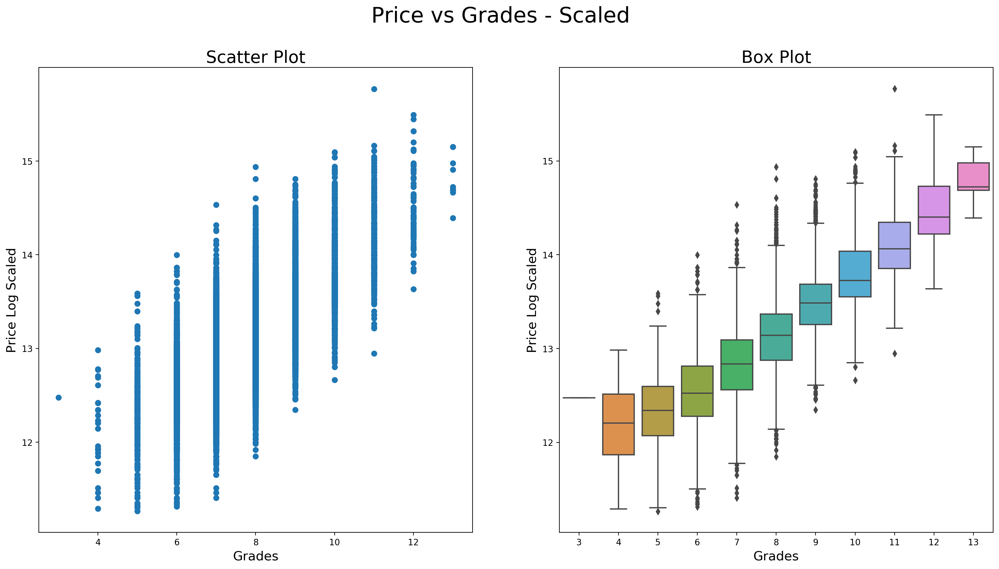

In [190]:
# initial_df = pd.get_dummies(df['grades'], prefix = column[:], drop_first=False)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=[20,10], dpi=200)

fig.suptitle("Price vs Grades - Scaled", fontsize=25)

ax[0].scatter(grade_price_df.grade, grade_price_df.log_price)
ax[0].set_title('Scatter Plot',fontdict={'fontsize':20})
ax[0].set_xlabel('Grades', fontdict={'fontsize':15})
ax[0].set_ylabel('Price Log Scaled', fontdict={'fontsize':15})

ax[1] = sns.boxplot(grade_price_df.grade, grade_price_df.log_price)
ax[1].set_title('Box Plot',fontdict={'fontsize':20})
ax[1].set_xlabel('Grades', fontdict={'fontsize':15})
ax[1].set_ylabel('Price Log Scaled', fontdict={'fontsize':15})
plt.savefig('Grades and Prices - Scaled', dpi=300)
plt.show()

We see that grades are one of the major factors that determines the price of the house.

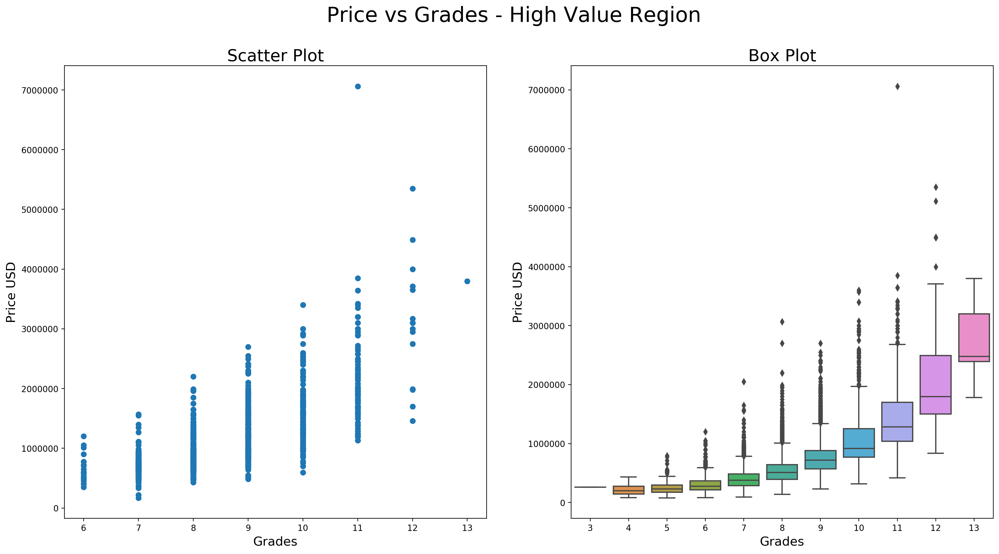

In [252]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=[20,10], dpi=200)

fig.suptitle("Price vs Grades - High Value Region", fontsize=25)

ax[0].scatter(high_price_zip_df.grade, high_price_zip_df.price)
ax[0].set_title('Scatter Plot',fontdict={'fontsize':20})
ax[0].set_xlabel('Grades', fontdict={'fontsize':15})
ax[0].set_ylabel('Price USD', fontdict={'fontsize':15})

ax[1] = sns.boxplot(df.grade, df.price)
ax[1].set_title('Box Plot',fontdict={'fontsize':20})
ax[1].set_xlabel('Grades', fontdict={'fontsize':15})
ax[1].set_ylabel('Price USD', fontdict={'fontsize':15})

plt.savefig('Grades and Prices - High Value Region', dpi=300)
plt.show()

## 3.4 Data Visualization - Best Sales Season

Though it is not a major factors of the housing pricing, I wanted to check and see when would be the best time to sell the house in order to bring out the most return of the investment.

In [216]:
df.groupby(by='sold_month').mean().price

sold_month
1    524336.47
2    507163.59
3    542968.55
4    560141.33
5    547305.35
6    554529.09
7    543236.67
8    532884.23
9    526130.78
10   531219.05
11   522322.52
12   524602.90
Name: price, dtype: float64

In [215]:
df.groupby(by='sold_month').count().price

sold_month
1      975
2     1244
3     1871
4     2226
5     2408
6     2174
7     2208
8     1931
9     1769
10    1869
11    1408
12    1466
Name: price, dtype: int64

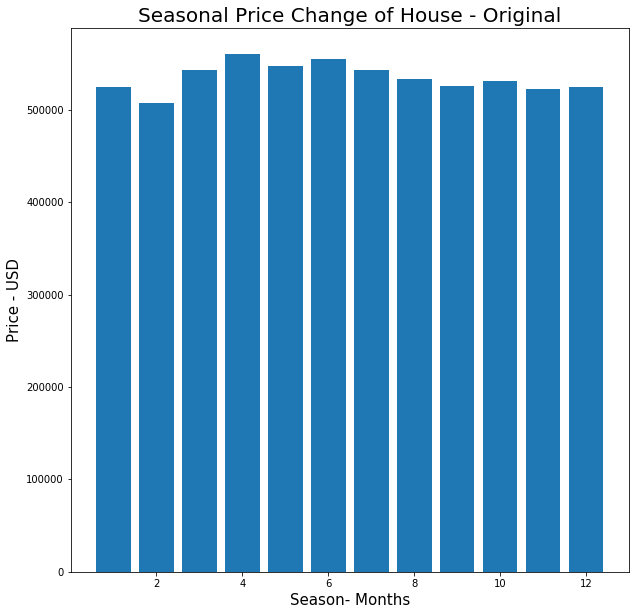

In [220]:
plt.figure(figsize=(10,10))
plt.bar(df.groupby(by='sold_month').mean()['price'].index,
        df.groupby(by='sold_month').mean()['price'])
plt.title('Seasonal Price Change of House - Original', fontdict={'fontsize':20})
plt.xlabel('Season- Months',fontdict={'fontsize':15})
plt.ylabel('Price - USD',fontdict={'fontsize':15})
plt.savefig('Seasonal Price Change of House - Original', dpi=300)
plt.show()

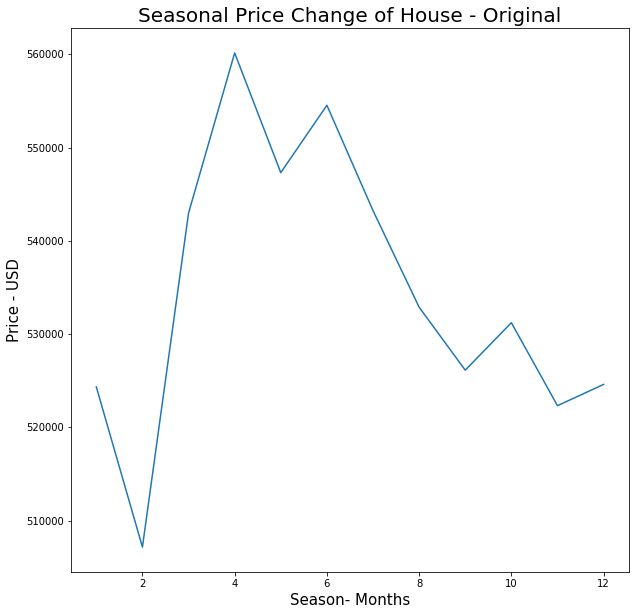

In [221]:
plt.figure(figsize=(10,10))
plt.plot(df.groupby(by='sold_month').mean()['price'])
plt.title('Seasonal Price Change of House - Original', fontdict={'fontsize':20})
plt.xlabel('Season- Months',fontdict={'fontsize':15})
plt.ylabel('Price - USD',fontdict={'fontsize':15})
plt.savefig('Seasonal Price Change of House - Original Plot', dpi=300)
plt.show()

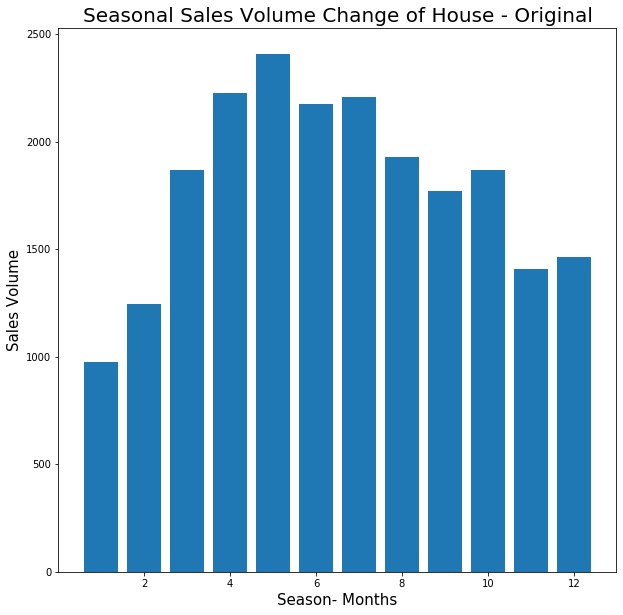

In [219]:
plt.figure(figsize=(10,10))
plt.bar(df.groupby(by='sold_month').count()['price'].index,
        df.groupby(by='sold_month').count()['price'])
plt.title('Seasonal Sales Volume Change of House - Original', fontdict={'fontsize':20})
plt.xlabel('Season- Months',fontdict={'fontsize':15})
plt.ylabel('Sales Volume',fontdict={'fontsize':15})
plt.savefig('Seasonal Sales Volume of House - Original', dpi=300)
plt.show()

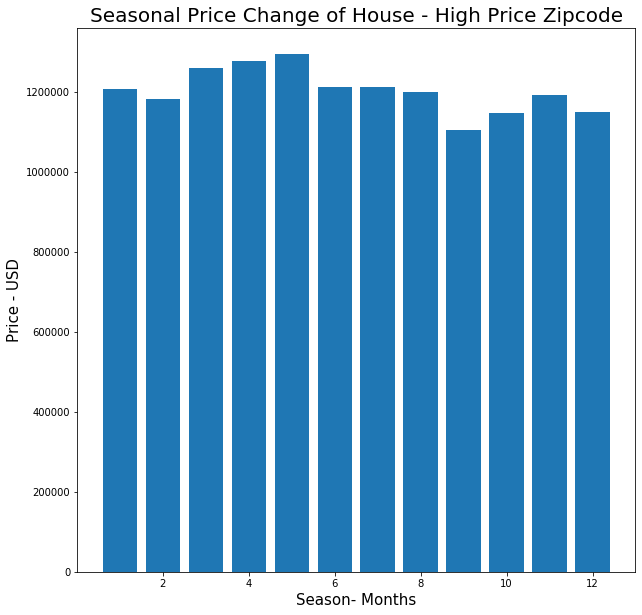

In [244]:
plt.figure(figsize=(10,10))
plt.bar(high_price_zip_df.groupby(by='sold_month').mean()['price'].index,
        high_price_zip_df.groupby(by='sold_month').mean()['price'])
plt.title('Seasonal Price Change of House - High Price Zipcode', fontdict={'fontsize':20})
plt.xlabel('Season- Months',fontdict={'fontsize':15})
plt.ylabel('Price - USD',fontdict={'fontsize':15})
plt.savefig('Seasonal Price Change of House - High Price Zipcode Bar', dpi=300)
plt.show()

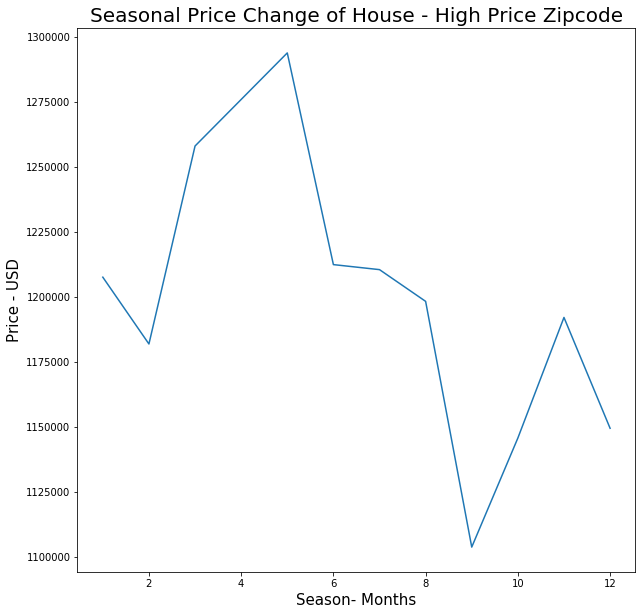

In [243]:
plt.figure(figsize=(10,10))
plt.plot(high_price_zip_df.groupby(by='sold_month').mean()['price'])
plt.title('Seasonal Price Change of House - High Price Zipcode', fontdict={'fontsize':20})
plt.xlabel('Season- Months',fontdict={'fontsize':15})
plt.ylabel('Price - USD',fontdict={'fontsize':15})
plt.savefig('Seasonal Price Change of House - High Price Zipcode Plot', dpi=300)
plt.show()

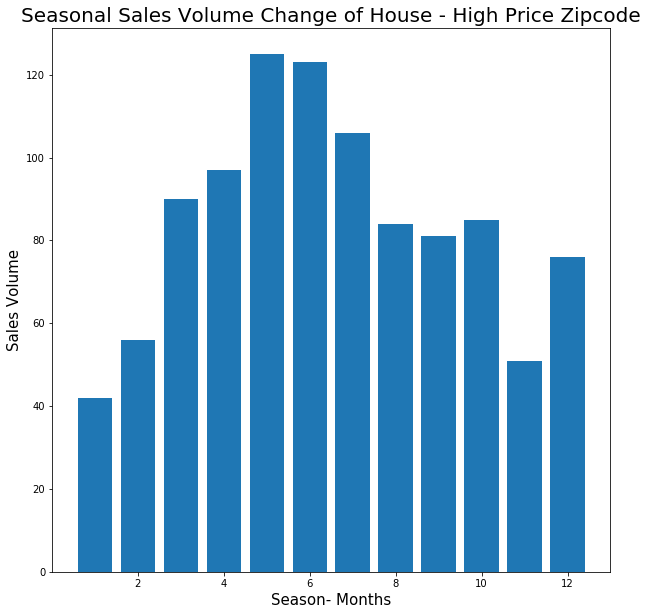

In [242]:
plt.figure(figsize=(10,10))
plt.bar(high_price_zip_df.groupby(by='sold_month').count()['price'].index,
        high_price_zip_df.groupby(by='sold_month').count()['price'])
plt.title('Seasonal Sales Volume Change of House - High Price Zipcode', fontdict={'fontsize':20})
plt.xlabel('Season- Months',fontdict={'fontsize':15})
plt.ylabel('Sales Volume',fontdict={'fontsize':15})
plt.savefig('Seasonal Sales Volume of House - High Price Zipcode', dpi=300)
plt.show()

# 4. Future Work

* Apply real life situation and predict actual value with given features.
* Take a deeper look into the variables that I dropped and how those could impact the price of the house. By using a smaller sample pools like zipcode base, lat and long radius, etc.
* Closer observation on how data is valid. I did little investigation with id and how some of the houses had quick turn arounds with big price jumps. See how those could have made impact to the data.

* Sales Examples

In [254]:
dup_id_df_98039 = dup_id_df.loc[dup_id_df.zipcode == 98039]
dup_id_df_98004 = dup_id_df.loc[dup_id_df.zipcode == 98004]
dup_id_df_98040 = dup_id_df.loc[dup_id_df.zipcode == 98040]
dup_id_df_98112 = dup_id_df.loc[dup_id_df.zipcode == 98112]
dup_id_df_98109 = dup_id_df.loc[dup_id_df.zipcode == 98109]
high_dup_id_df = pd.concat([dup_id_df_98004,dup_id_df_98039,dup_id_df_98040, dup_id_df_98109,
                           dup_id_df_98112])
high_dup_id_df.groupby(by='id').head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
15998,5536100020,12/15/2014,987000.00,3,2.00,2160,15788,1.00,0.00,0.00,3,8,2160,0.0,1951,0.00,98004,47.62,-122.21,2260,9787
15999,5536100020,5/12/2015,1190000.00,3,2.00,2160,15788,1.00,0.00,0.00,3,8,2160,0.0,1951,0.00,98004,47.62,-122.21,2260,9787
4917,9809000020,5/13/2014,1900000.00,5,2.25,3120,16672,2.00,0.00,0.00,4,9,3120,0.0,1969,nan,98004,47.65,-122.22,3740,17853
4918,9809000020,3/13/2015,1940000.00,5,2.25,3120,16672,2.00,0.00,0.00,4,9,3120,0.0,1969,0.00,98004,47.65,-122.22,3740,17853
4073,3262300940,11/7/2014,875000.00,3,1.00,1220,8119,1.00,0.00,0.00,4,7,1220,0.0,1955,nan,98039,47.63,-122.24,1910,8119
4074,3262300940,2/10/2015,940000.00,3,1.00,1220,8119,1.00,0.00,0.00,4,7,1220,0.0,1955,nan,98039,47.63,-122.24,1910,8119
13721,5332200530,6/13/2014,910000.00,5,2.50,2350,4000,2.00,0.00,0.00,3,9,2350,0.0,1993,0.00,98112,47.63,-122.30,1840,4000
13722,5332200530,4/24/2015,1020000.00,5,2.50,2350,4000,2.00,0.00,0.00,3,9,2350,0.0,1993,nan,98112,47.63,-122.30,1840,4000


There has been 4 transactions done in high zipcode price regions. Though sample sizes are small to verfy any hypothesis, I was definitely able to observe the price increase in the area. 

# 5. Conclusion

1. With data observation, I was able to find couple interesting facts about the data. There were few unknown factors to the data like duplicated ID, quick turn arounds of houses with large price jump, ouliers, null values, and different data types. After performing the clean up, I was able to have a better overview of the data.


2. To understand what features that impact the housing price the most, I had to perform further Data Cleaning and Scrubbing. I started by defining categorical and non catergorical columns. Found key features based on low p_values. Also tested Multicollinearity and removed columns accordingly. I added couple visuals to see how each clean up was able to bring up the accuracy of the regression model results.

    Starting data has R2_score of 0.747 with accuracy of 58.9%
    Final product of data has R2_score of 0.884 with accuracy of 88.4%
    
    3 Key Features that influence the housing price are size of living, location (zipcode, lat and long) and grades.


3. I have visualized the key features vs price to show how each features affects the pricing of the house. 
    
    By using scatter plot, I showed map the location of each houses and used the colors to make comparison of the prices.
    By using line graph, I visualized the the mean of housing prices according to zipcode. 
    By using joint plot, I graphed to show the correlation between price and house sizes
    Lastly, box plot shows how grades and price are positively correlated.
    

4. For future work, I would like to take a closer look at other features could make an impact on the housing prices.